In [ ]:
import io
import os
import re
import json
import torch
import html
import base64
import itertools
import cv2
import numpy as np
import supervision as sv

from google.colab import userdata
from IPython.core.display import display, HTML
from torch.utils.data import Dataset, DataLoader
from transformers import (
    AdamW,
    AutoModelForCausalLM,
    AutoProcessor,
    get_scheduler
)
from tqdm import tqdm
from typing import List, Dict, Any, Tuple, Generator
from peft import LoraConfig, get_peft_model
from PIL import Image
from roboflow import Roboflow

import moviepy
from moviepy.editor import ImageSequenceClip


In [ ]:
pip install peft

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 251.6/251.6 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 309.4/309.4 kB 8.1 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manyl

In [ ]:
pip install roboflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 9.0 MB/s eta 0:00:00
  Attempting uninstall: chardet
    Found existing installation: chardet 5.2.0
    Uninstalling chardet-5.2.0:
      Successfully uninstalled chardet-5.2.0


In [ ]:
pip install supervision

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.0/124.0 kB 2.8 MB/s eta 0:00:00


In [ ]:
!wget -q https://media.roboflow.com/notebooks/examples/dog.jpeg
!ls -lh

total 108K
-rw-r--r-- 1 root root 104K Jun  2  2023 dog.jpeg
drwxr-xr-x 1 root root 4.0K Jul  2 13:24 sample_data


In [ ]:
EXAMPLE_IMAGE_PATH = "/content/trash 2.jpg"

In [ ]:
!pip install -q roboflow git+https://github.com/roboflow/supervision.git

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [ ]:
pip install flash_attn timm einops

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 11.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 26.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.2/43.2 kB 6.7 MB/s eta 0:00:00
  Created wheel for flash_attn: filename=flash_attn-2.5.9.post1-cp310-cp310-linux_x86_64.whl size=120889689 sha256=5022ba11d48bf74926da9c16260f4ea2b9bb7f4e29bdb4bd6e1383ad1c55d16f
  Stored in directory: /root/.cache/pip/wheels/cc/ad/f6/7ccf0238790d6346e9fe622923a76ec218e890d356b9a2754a
Successfully built flash_attn


In [ ]:
CHECKPOINT = "microsoft/Florence-2-base-ft"
REVISION = 'refs/pr/6'
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = AutoModelForCausalLM.from_pretrained(CHECKPOINT, trust_remote_code=True, revision=REVISION).to(DEVICE)
processor = AutoProcessor.from_pretrained(CHECKPOINT, trust_remote_code=True, revision=REVISION)

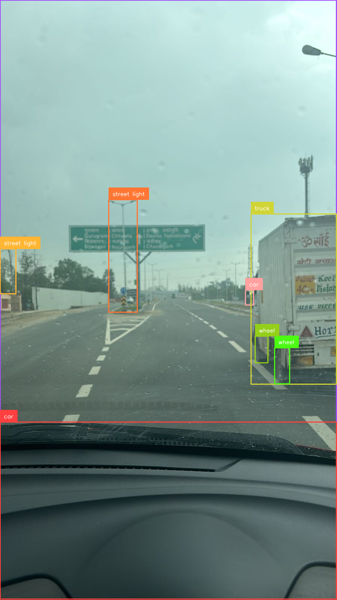

In [ ]:
# @title Example object detection inference

image = Image.open('/content/WhatsApp Image 2024-07-04 at 15.06.34.png')
task = "<OD>"
text = "<OD>"

inputs = processor(text=text, images=image, return_tensors="pt").to(DEVICE)
generated_ids = model.generate(
    input_ids=inputs["input_ids"],
    pixel_values=inputs["pixel_values"],
    max_new_tokens=1024,
    num_beams=3
)
generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]
response = processor.post_process_generation(generated_text, task=task, image_size=(image.width, image.height))
detections = sv.Detections.from_lmm(sv.LMM.FLORENCE_2, response, resolution_wh=image.size)

bounding_box_annotator = sv.BoundingBoxAnnotator(color_lookup=sv.ColorLookup.INDEX)
label_annotator = sv.LabelAnnotator(color_lookup=sv.ColorLookup.INDEX)

image = bounding_box_annotator.annotate(image, detections)
image = label_annotator.annotate(image, detections)
image.thumbnail((600, 600))
image

In [ ]:

from roboflow import Roboflow
rf = Roboflow(api_key="70fC9tQbP9SpHuxFzXA3")
project = rf.workspace("siddharth-kumar-sah").project("bottle-lc3sx")
version = project.version(1)
dataset = version.download("florence2-od")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to bottle-1 in florence2-od:: 100%|██████████| 136/136 [00:00<00:00, 2742.17it/s]


In [ ]:
!head -n 5 {dataset.location}/train/annotations.jsonl

{"image":"IMG_0611_jpg.rf.1161d2b94010ada7aa650fa5a693af2d.jpg","prefix":"<OD>","suffix":"bottle<loc_27><loc_318><loc_377><loc_544>bottle<loc_510><loc_546><loc_940><loc_733>bottle<loc_507><loc_293><loc_931><loc_518>bottle<loc_158><loc_367><loc_492><loc_725>"}
{"image":"IMG_0602_jpg.rf.0115840909ae6c754992d579621b6397.jpg","prefix":"<OD>","suffix":"bottle<loc_21><loc_192><loc_913><loc_612>"}
{"image":"IMG_0601_jpg.rf.0b07af35891a402713e09285dfadc383.jpg","prefix":"<OD>","suffix":"bottle<loc_1><loc_288><loc_854><loc_712>"}
{"image":"IMG_0587_jpg.rf.0bd627ae1fb529a2b5ba9448053bd85e.jpg","prefix":"<OD>","suffix":"bottle<loc_303><loc_3><loc_803><loc_977>"}
{"image":"IMG_0589_jpg.rf.0e623f9ee0f6757b8ed57d149c9eb8b6.jpg","prefix":"<OD>","suffix":"bottle<loc_350><loc_10><loc_725><loc_999>"}


In [ ]:
# @title Define `DetectionsDataset` class

class JSONLDataset:
    def __init__(self, jsonl_file_path: str, image_directory_path: str):
        self.jsonl_file_path = jsonl_file_path
        self.image_directory_path = image_directory_path
        self.entries = self._load_entries()

    def _load_entries(self) -> List[Dict[str, Any]]:
        entries = []
        with open(self.jsonl_file_path, 'r') as file:
            for line in file:
                data = json.loads(line)
                entries.append(data)
        return entries

    def __len__(self) -> int:
        return len(self.entries)

    def __getitem__(self, idx: int) -> Tuple[Image.Image, Dict[str, Any]]:
        if idx < 0 or idx >= len(self.entries):
            raise IndexError("Index out of range")

        entry = self.entries[idx]
        image_path = os.path.join(self.image_directory_path, entry['image'])
        try:
            image = Image.open(image_path)
            return (image, entry)
        except FileNotFoundError:
            raise FileNotFoundError(f"Image file {image_path} not found.")


class DetectionDataset(Dataset):
    def __init__(self, jsonl_file_path: str, image_directory_path: str):
        self.dataset = JSONLDataset(jsonl_file_path, image_directory_path)

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        image, data = self.dataset[idx]
        prefix = data['prefix']
        suffix = data['suffix']
        return prefix, suffix, image

In [ ]:
# @title Initiate `DetectionsDataset` and `DataLoader` for train and validation subsets

BATCH_SIZE = 5
NUM_WORKERS = 0

def collate_fn(batch):
    questions, answers, images = zip(*batch)
    inputs = processor(text=list(questions), images=list(images), return_tensors="pt", padding=True).to(DEVICE)
    return inputs, answers

train_dataset = DetectionDataset(
    jsonl_file_path = f"{dataset.location}/train/annotations.jsonl",
    image_directory_path = f"{dataset.location}/train/"
)
val_dataset = DetectionDataset(
    jsonl_file_path = f"{dataset.location}/valid/annotations.jsonl",
    image_directory_path = f"{dataset.location}/valid/"
)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, collate_fn=collate_fn, num_workers=NUM_WORKERS, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, collate_fn=collate_fn, num_workers=NUM_WORKERS)

In [ ]:
# @title Setup LoRA Florence-2 model

config = LoraConfig(
    r=8,
    lora_alpha=8,
    target_modules=["q_proj", "o_proj", "k_proj", "v_proj", "linear", "Conv2d", "lm_head", "fc2"],
    task_type="CAUSAL_LM",
    lora_dropout=0.05,
    bias="none",
    inference_mode=False,
    use_rslora=True,
    init_lora_weights="gaussian",
    revision=REVISION
)

peft_model = get_peft_model(model, config)
peft_model.print_trainable_parameters()

trainable params: 1,929,928 || all params: 272,733,896 || trainable%: 0.7076



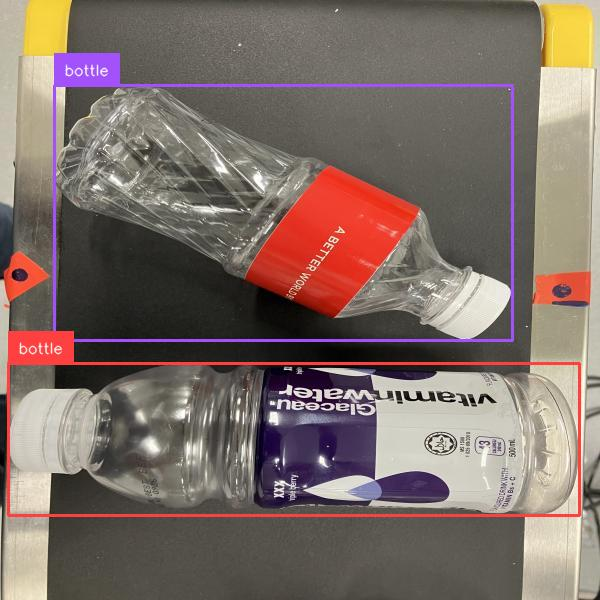
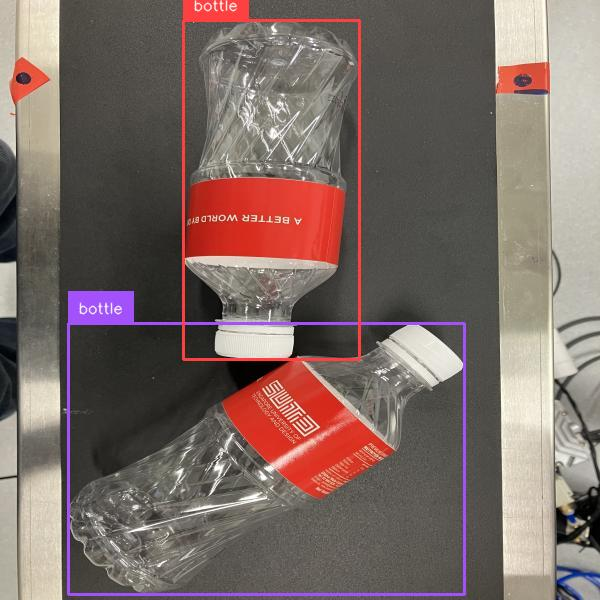
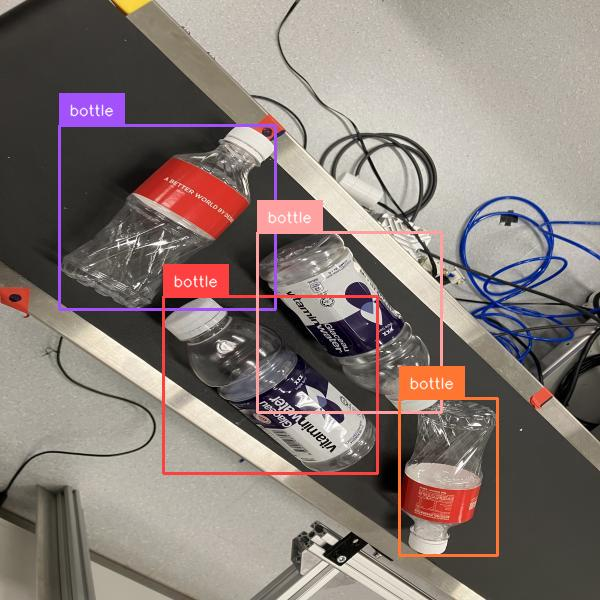
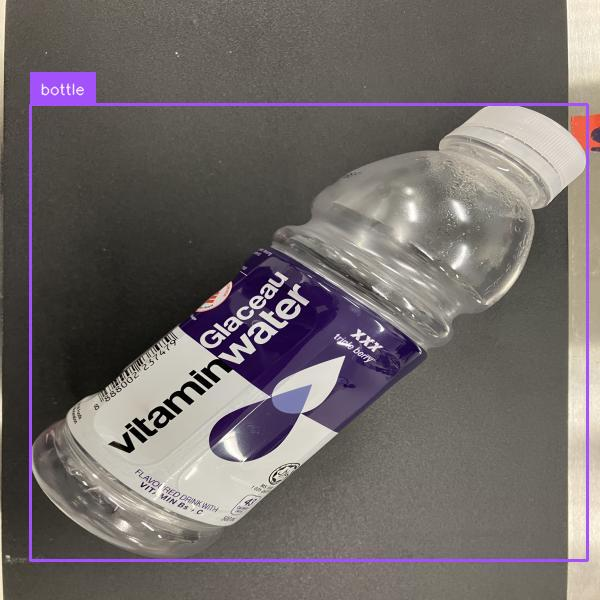

In [ ]:
# @title Run inference with pre-trained Florence-2 model on validation dataset

def render_inline(image: Image.Image, resize=(128, 128)):
    """Convert image into inline html."""
    image.resize(resize)
    with io.BytesIO() as buffer:
        image.save(buffer, format='jpeg')
        image_b64 = str(base64.b64encode(buffer.getvalue()), "utf-8")
        return f"data:image/jpeg;base64,{image_b64}"


def render_example(image: Image.Image, response):
    try:
        detections = sv.Detections.from_lmm(sv.LMM.FLORENCE_2, response, resolution_wh=image.size)
        image = sv.BoundingBoxAnnotator(color_lookup=sv.ColorLookup.INDEX).annotate(image.copy(), detections)
        image = sv.LabelAnnotator(color_lookup=sv.ColorLookup.INDEX).annotate(image, detections)
    except:
        print('failed to redner model response')
    return f"""
<div style="display: inline-flex; align-items: center; justify-content: center;">
    <img style="width:256px; height:256px;" src="{render_inline(image, resize=(128, 128))}" />
    <p style="width:512px; margin:10px; font-size:small;">{html.escape(json.dumps(response))}</p>
</div>
"""


def render_inference_results(model, dataset: DetectionDataset, count: int):
    html_out = ""
    count = min(count, len(dataset))
    for i in range(count):
        image, data = dataset.dataset[i]
        prefix = data['prefix']
        suffix = data['suffix']
        inputs = processor(text=prefix, images=image, return_tensors="pt").to(DEVICE)
        generated_ids = model.generate(
            input_ids=inputs["input_ids"],
            pixel_values=inputs["pixel_values"],
            max_new_tokens=1024,
            num_beams=3
        )
        generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]
        answer = processor.post_process_generation(generated_text, task='<OD>', image_size=image.size)
        html_out += render_example(image, answer)

    display(HTML(html_out))

render_inference_results(peft_model, val_dataset, 4)

In [ ]:
# @title Define train loop

def train_model(train_loader, val_loader, model, processor, epochs=10, lr=1e-6):
    optimizer = AdamW(model.parameters(), lr=lr)
    num_training_steps = epochs * len(train_loader)
    lr_scheduler = get_scheduler(
        name="linear",
        optimizer=optimizer,
        num_warmup_steps=0,
        num_training_steps=num_training_steps,
    )

    render_inference_results(peft_model, val_loader.dataset, 6)

    for epoch in range(epochs):
        model.train()
        train_loss = 0
        for inputs, answers in tqdm(train_loader, desc=f"Training Epoch {epoch + 1}/{epochs}"):

            input_ids = inputs["input_ids"]
            pixel_values = inputs["pixel_values"]
            labels = processor.tokenizer(
                text=answers,
                return_tensors="pt",
                padding=True,
                return_token_type_ids=False
            ).input_ids.to(DEVICE)

            outputs = model(input_ids=input_ids, pixel_values=pixel_values, labels=labels)
            loss = outputs.loss

            loss.backward(), optimizer.step(), lr_scheduler.step(), optimizer.zero_grad()
            train_loss += loss.item()

        avg_train_loss = train_loss / len(train_loader)
        print(f"Average Training Loss: {avg_train_loss}")

        model.eval()
        val_loss = 0
        with torch.no_grad():
            for inputs, answers in tqdm(val_loader, desc=f"Validation Epoch {epoch + 1}/{epochs}"):

                input_ids = inputs["input_ids"]
                pixel_values = inputs["pixel_values"]
                labels = processor.tokenizer(
                    text=answers,
                    return_tensors="pt",
                    padding=True,
                    return_token_type_ids=False
                ).input_ids.to(DEVICE)

                outputs = model(input_ids=input_ids, pixel_values=pixel_values, labels=labels)
                loss = outputs.loss

                val_loss += loss.item()

            avg_val_loss = val_loss / len(val_loader)
            print(f"Average Validation Loss: {avg_val_loss}")

            render_inference_results(peft_model, val_loader.dataset, 6)

        output_dir = f"./model_checkpoints/epoch_{epoch+1}"
        os.makedirs(output_dir, exist_ok=True)
        model.save_pretrained(output_dir)
        processor.save_pretrained(output_dir)

This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning



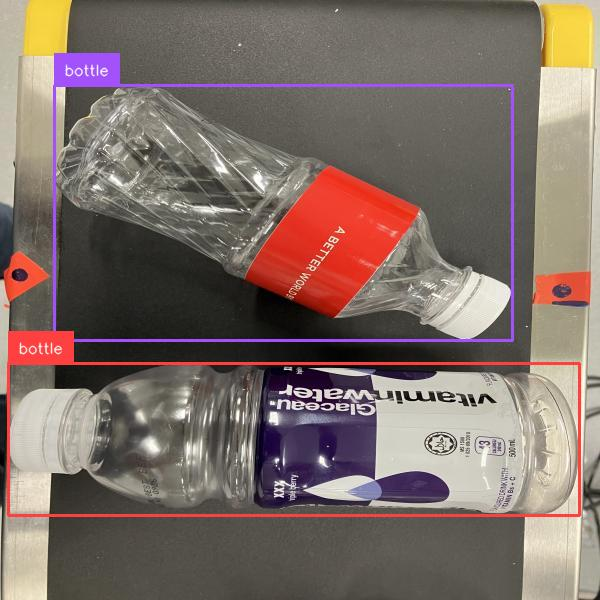
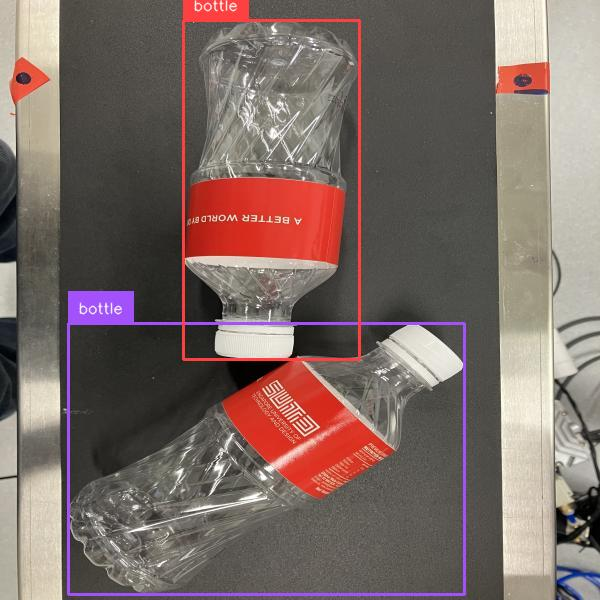
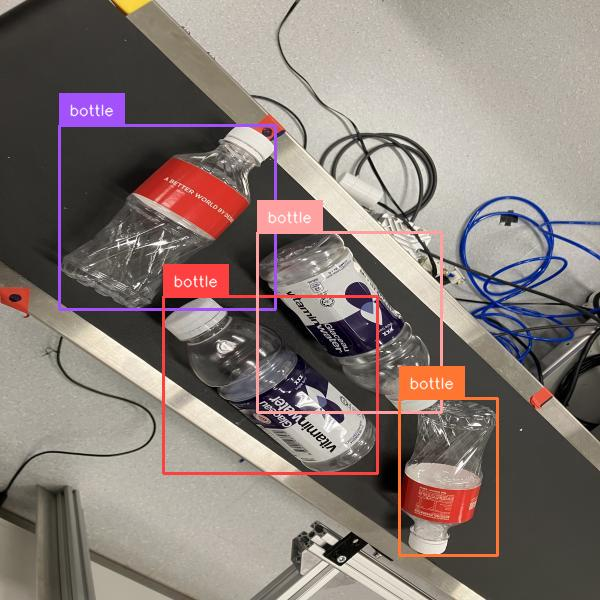
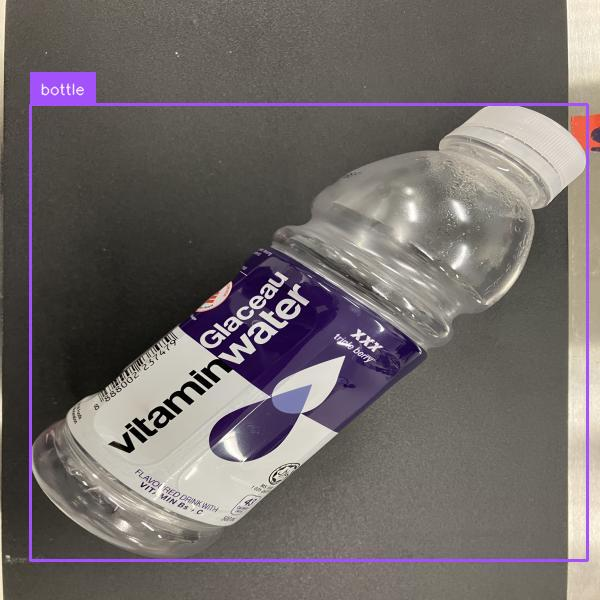
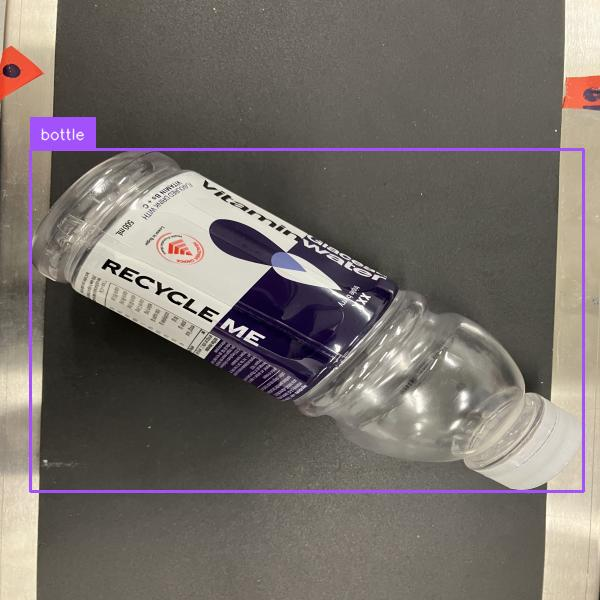
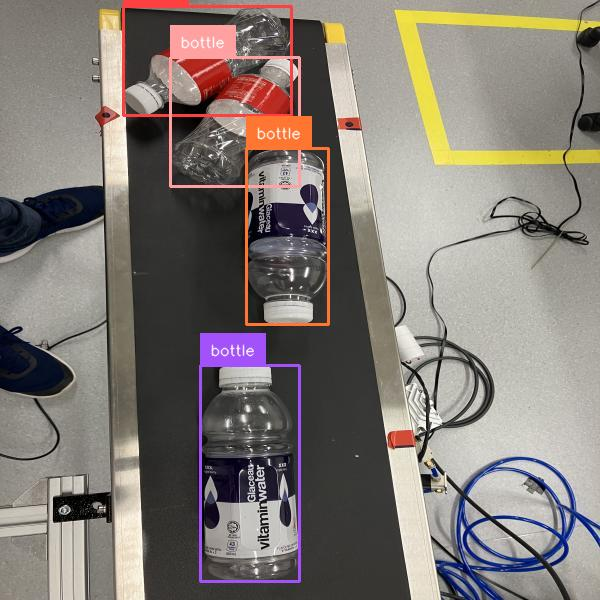

Training Epoch 1/10: 100%|██████████| 23/23 [00:57<00:00,  2.48s/it]


Average Training Loss: 7.310344042985336


Validation Epoch 1/10: 100%|██████████| 2/2 [00:02<00:00,  1.14s/it]


Average Validation Loss: 7.771377325057983



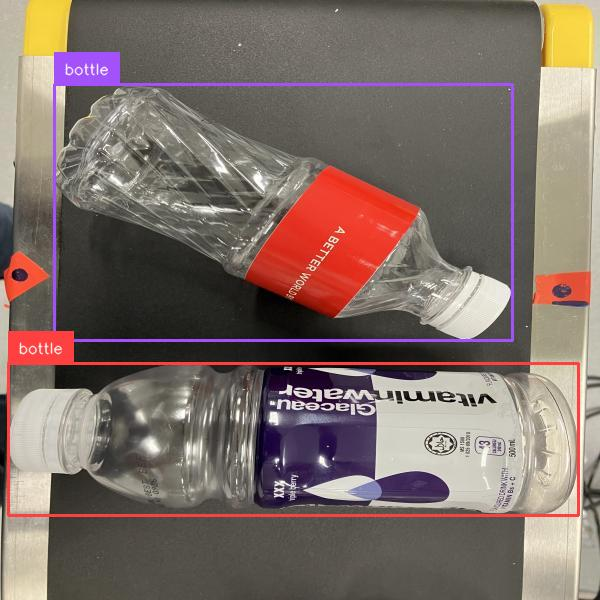
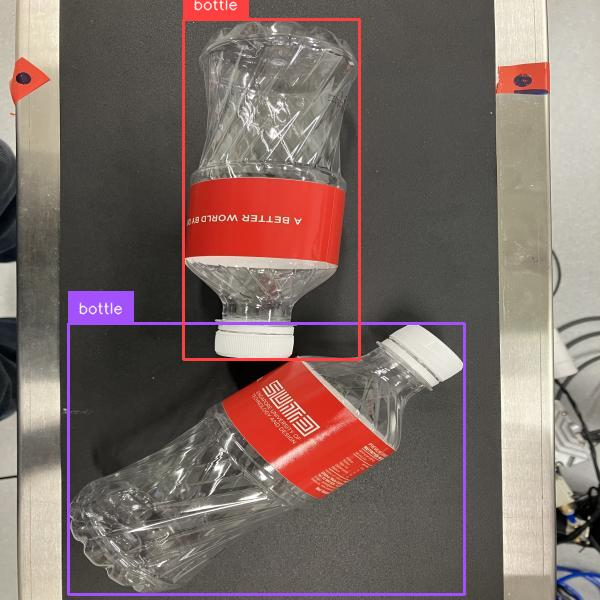
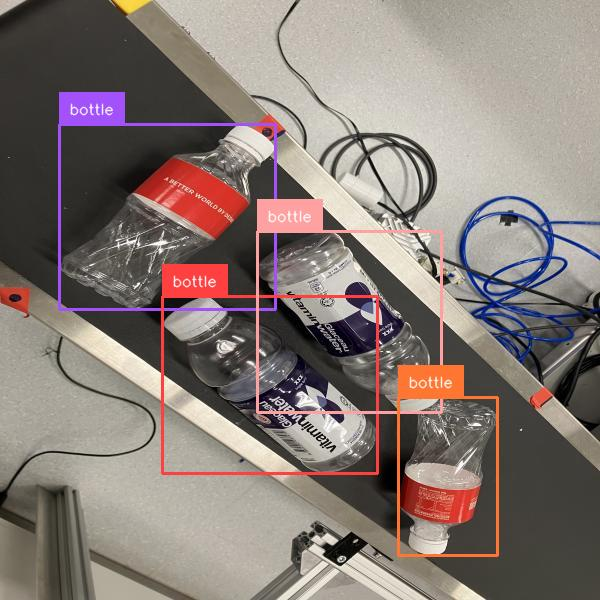
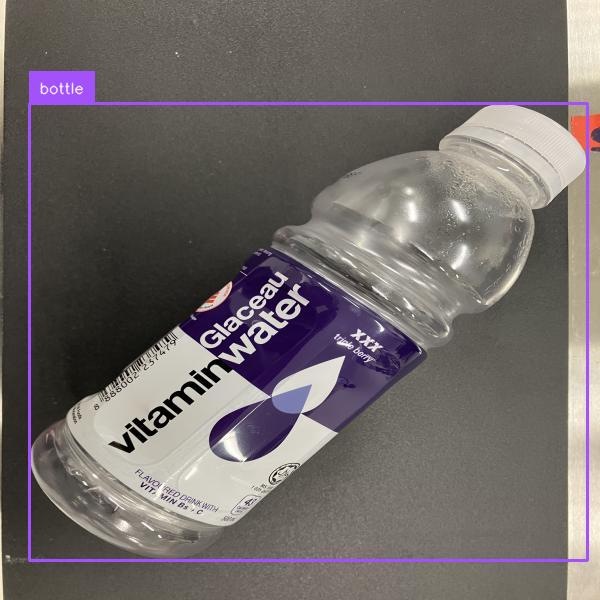
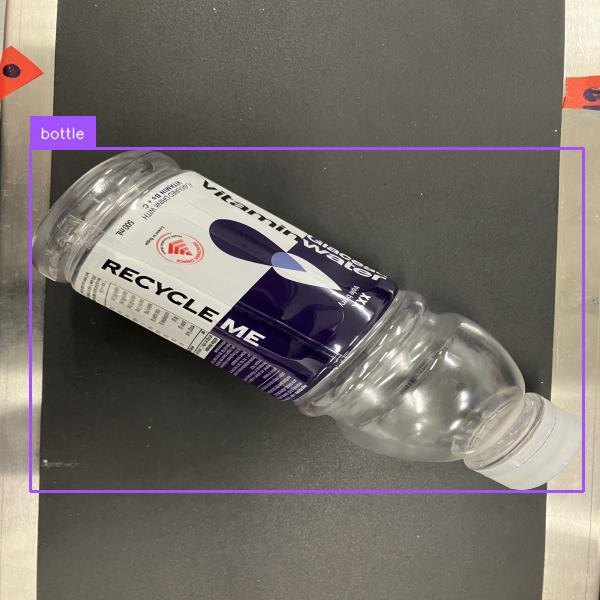
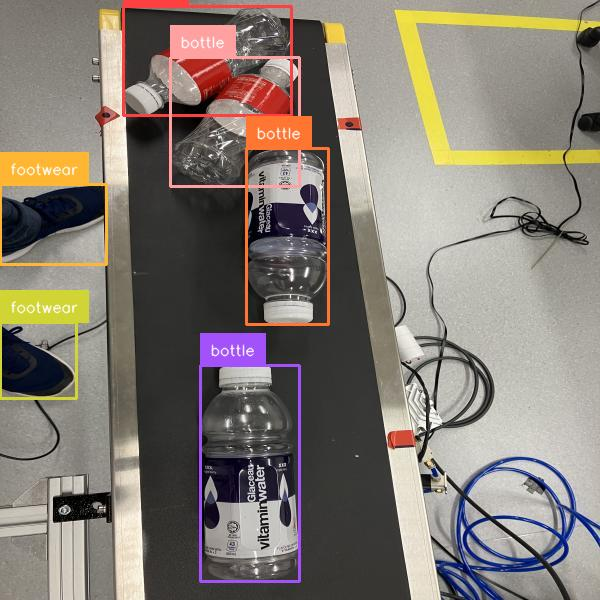

Setting `save_embedding_layers` to `True` as embedding layers found in `target_modules`.
Training Epoch 2/10: 100%|██████████| 23/23 [00:51<00:00,  2.24s/it]


Average Training Loss: 6.989029200180717


Validation Epoch 2/10: 100%|██████████| 2/2 [00:02<00:00,  1.25s/it]


Average Validation Loss: 7.129115343093872



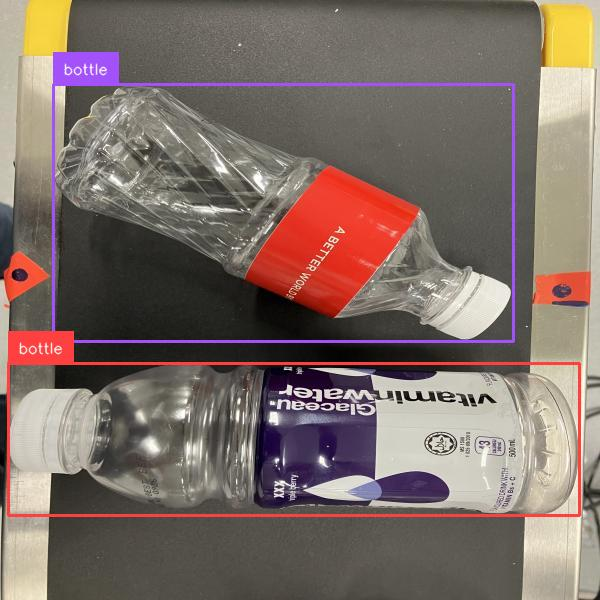
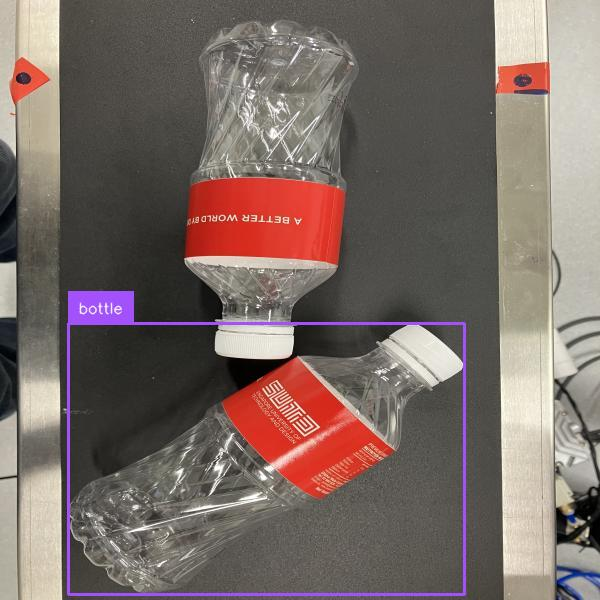
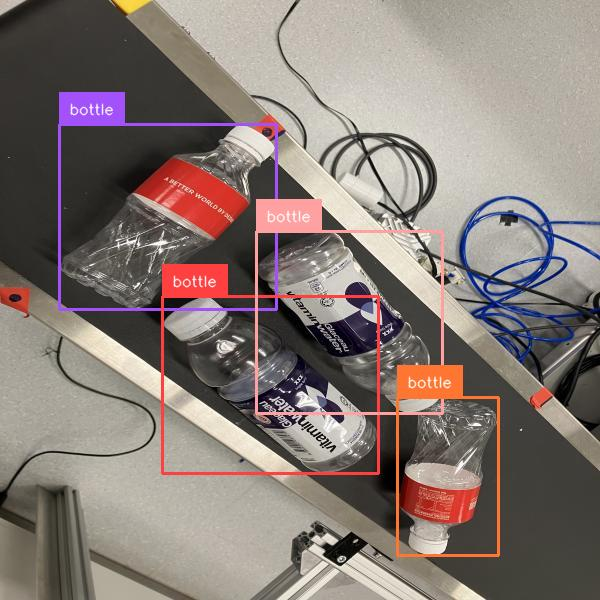
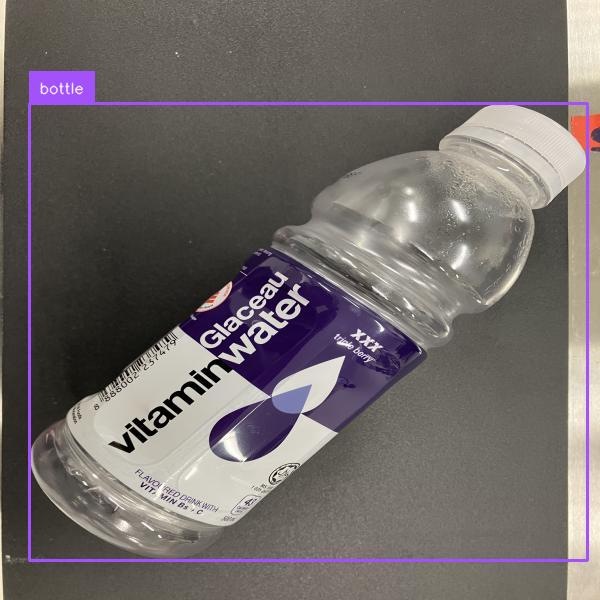
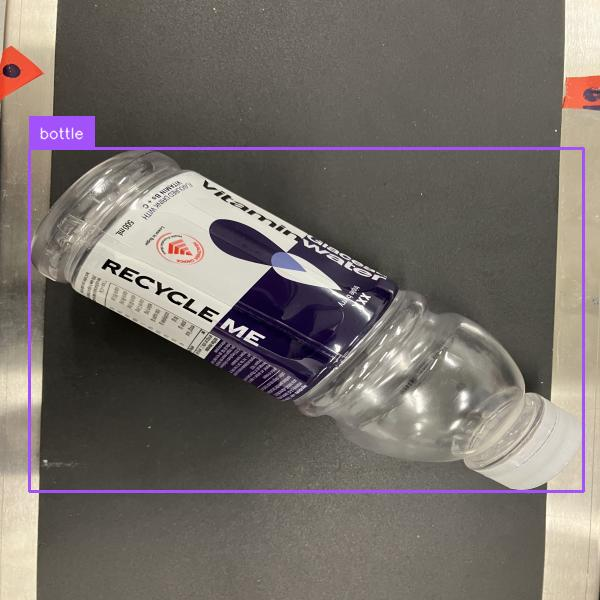
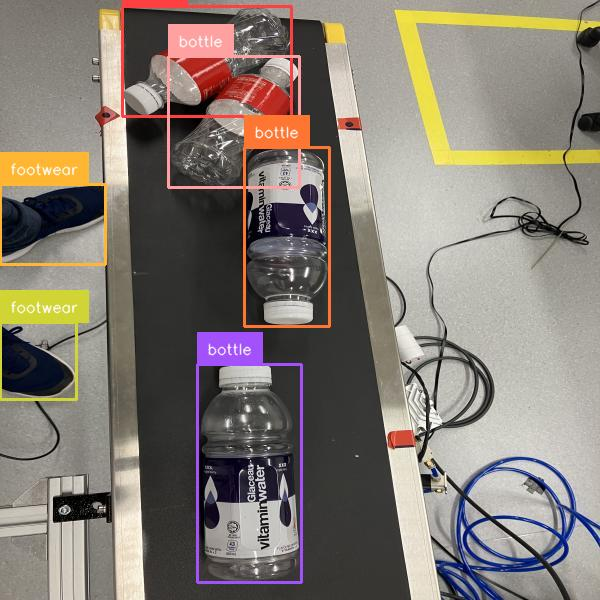

Training Epoch 3/10: 100%|██████████| 23/23 [00:51<00:00,  2.23s/it]


Average Training Loss: 6.585345413373864


Validation Epoch 3/10: 100%|██████████| 2/2 [00:02<00:00,  1.15s/it]


Average Validation Loss: 6.667372703552246



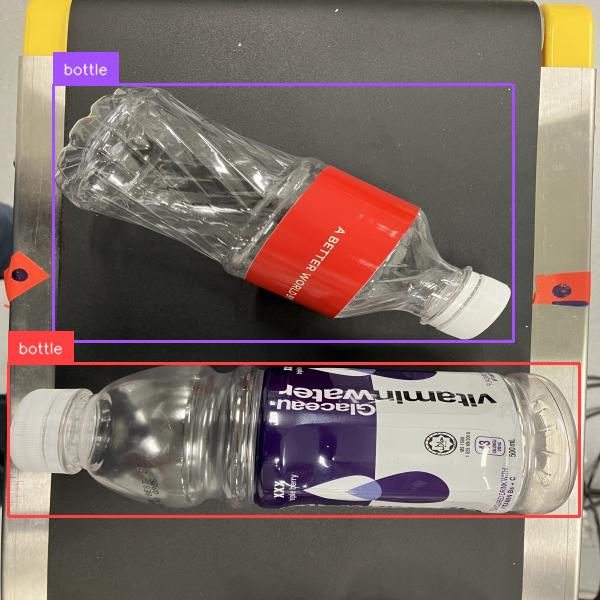
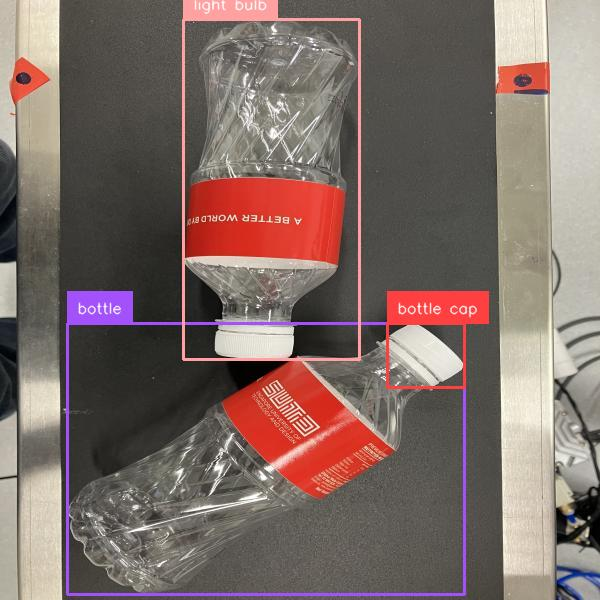
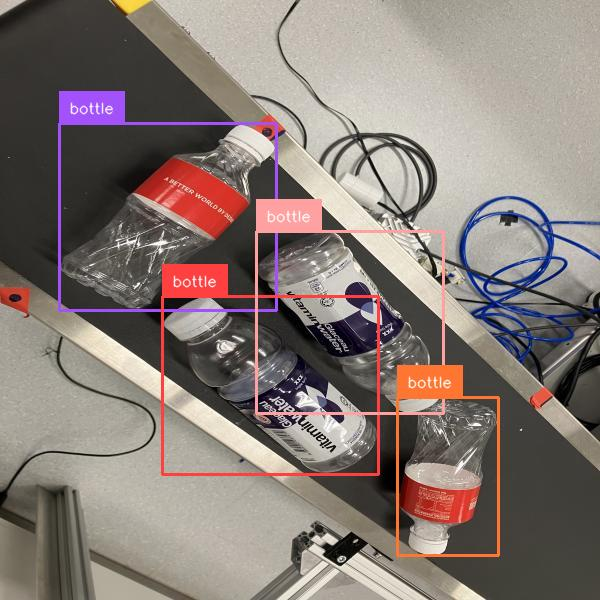
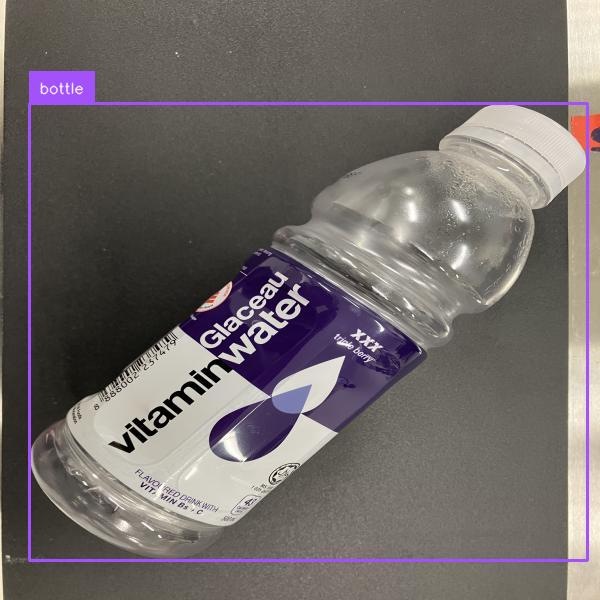
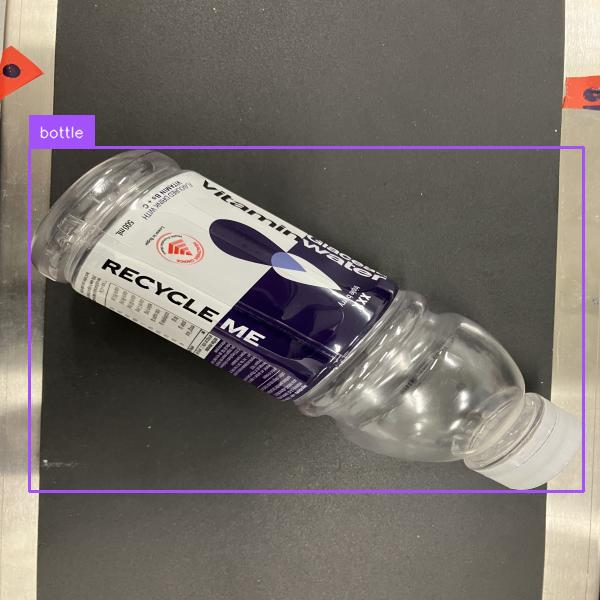
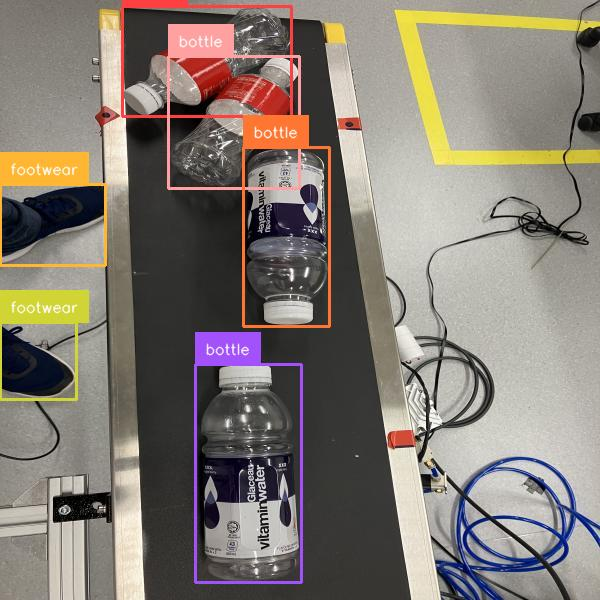

Training Epoch 4/10: 100%|██████████| 23/23 [00:51<00:00,  2.24s/it]


Average Training Loss: 6.3676409099413


Validation Epoch 4/10: 100%|██████████| 2/2 [00:02<00:00,  1.17s/it]


Average Validation Loss: 6.302879095077515



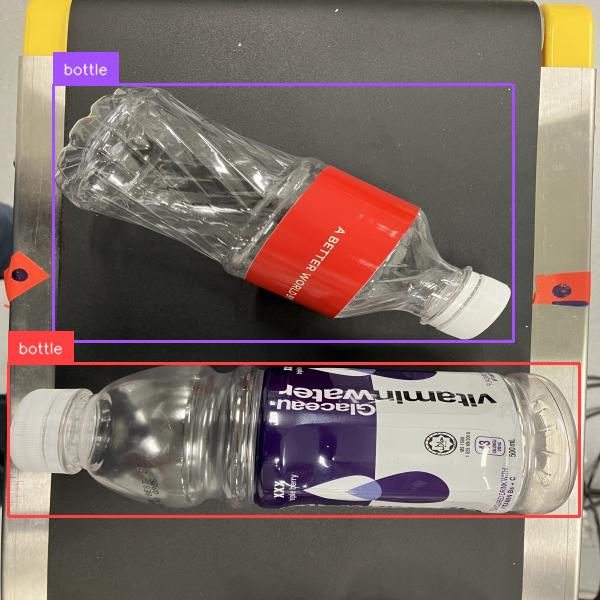
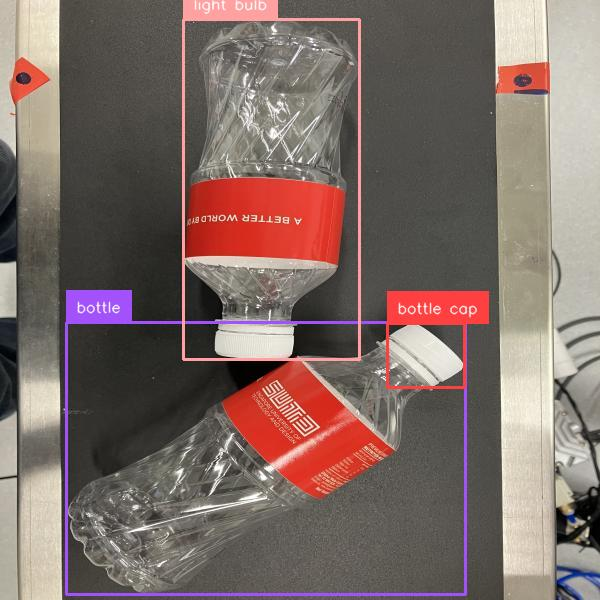
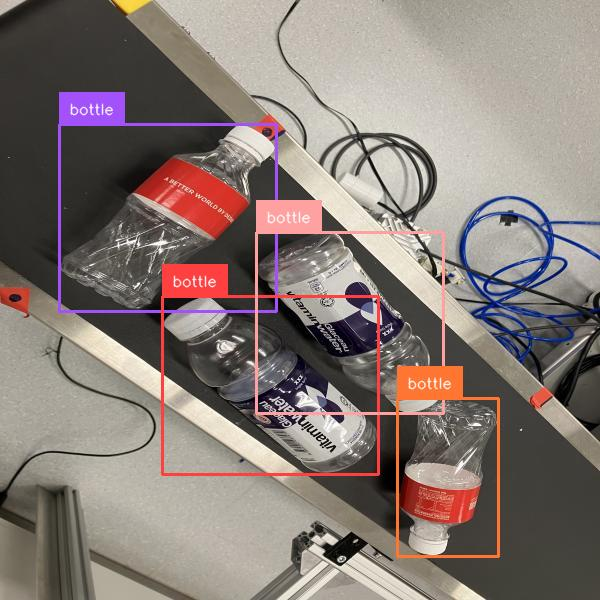
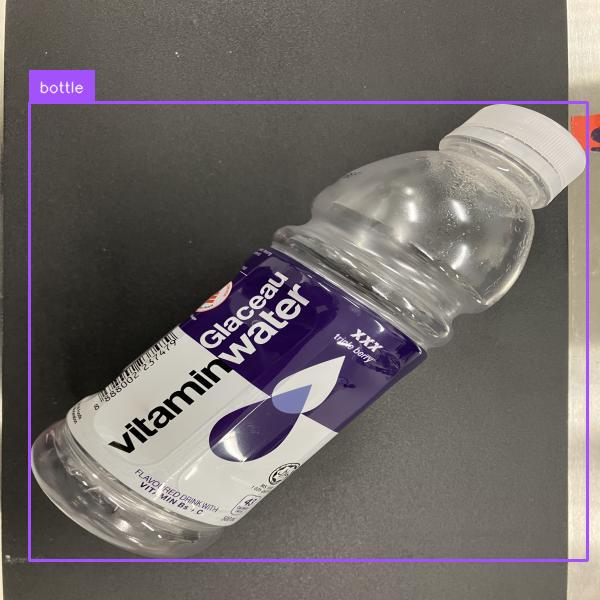
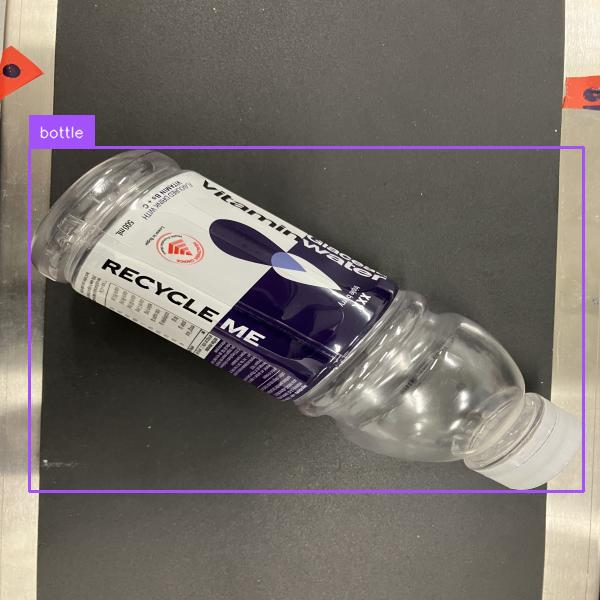
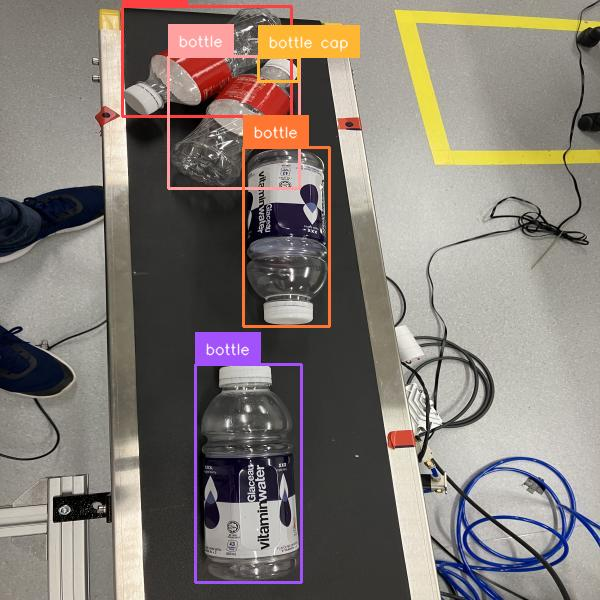

Training Epoch 5/10: 100%|██████████| 23/23 [00:51<00:00,  2.24s/it]


Average Training Loss: 6.076542201249496


Validation Epoch 5/10: 100%|██████████| 2/2 [00:02<00:00,  1.20s/it]


Average Validation Loss: 6.003482103347778



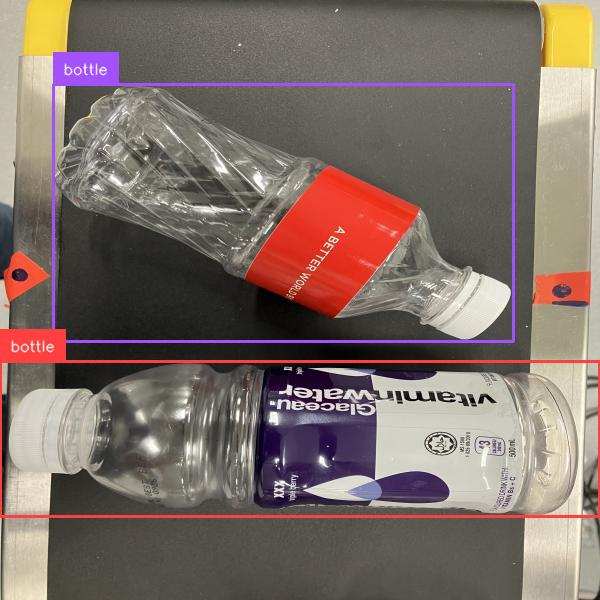
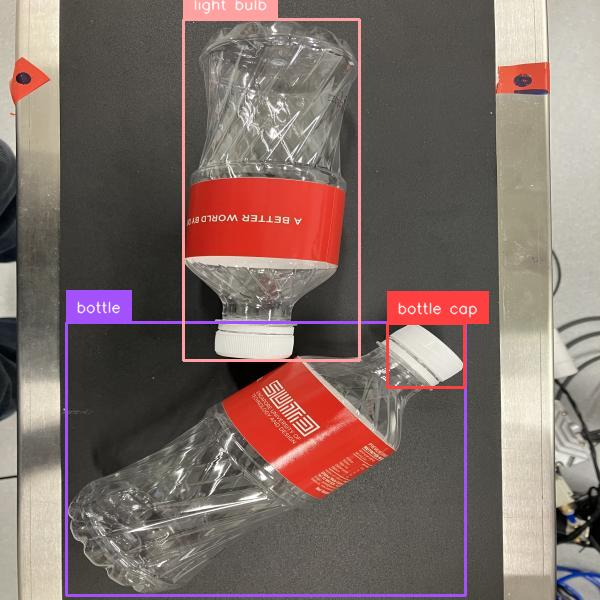
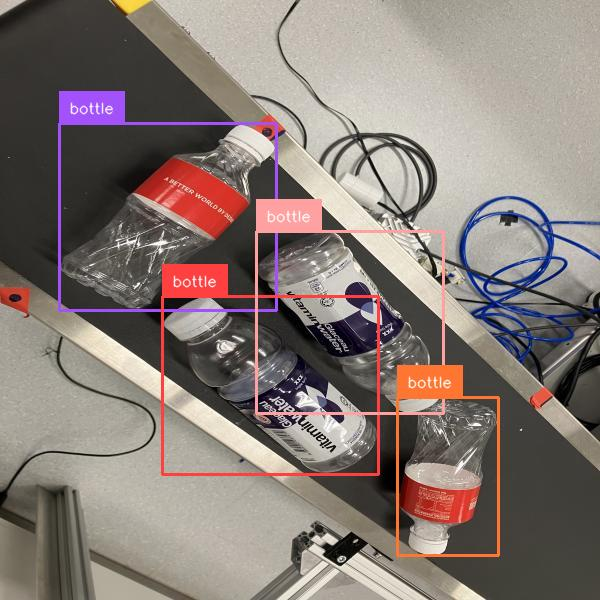
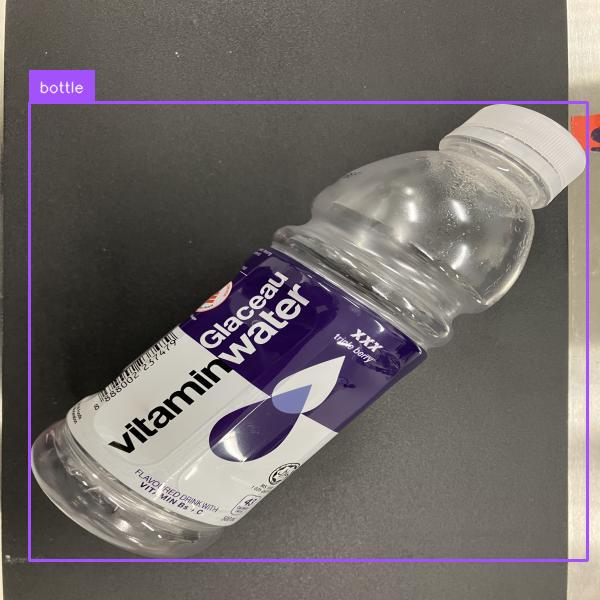
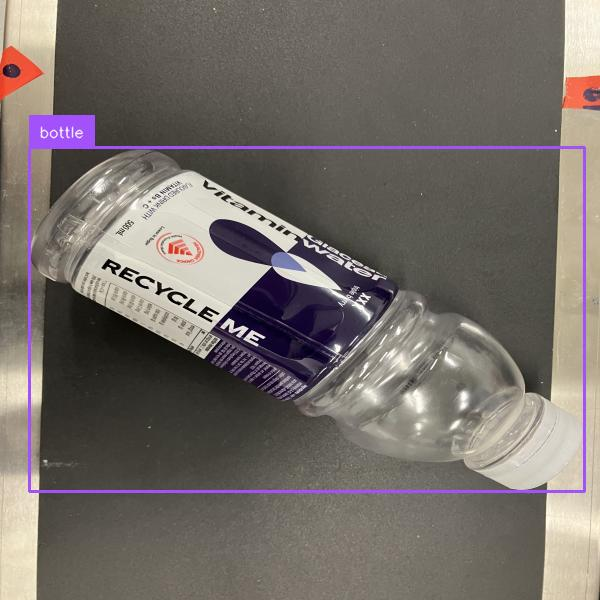
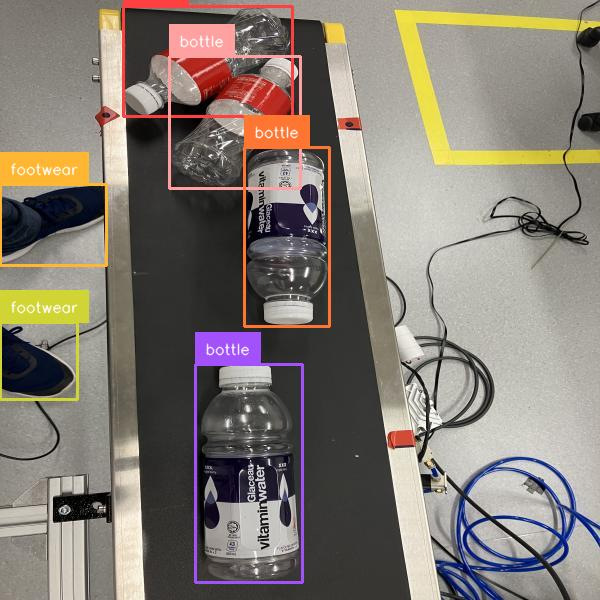

Training Epoch 6/10: 100%|██████████| 23/23 [00:51<00:00,  2.25s/it]


Average Training Loss: 5.772903193598208


Validation Epoch 6/10: 100%|██████████| 2/2 [00:02<00:00,  1.17s/it]


Average Validation Loss: 5.779519319534302



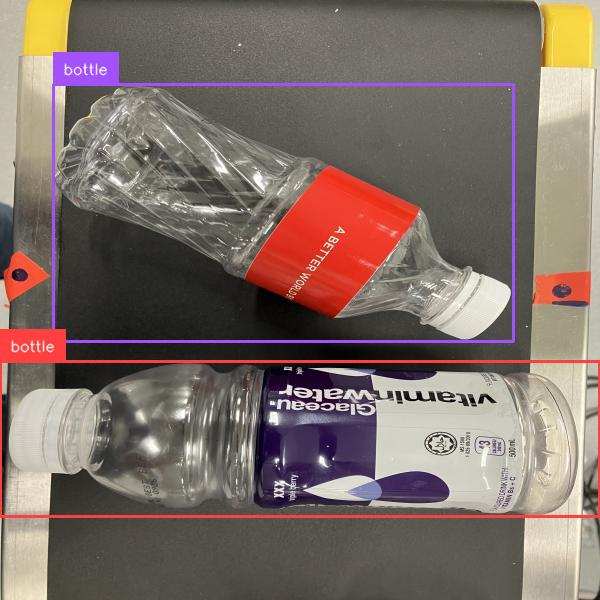
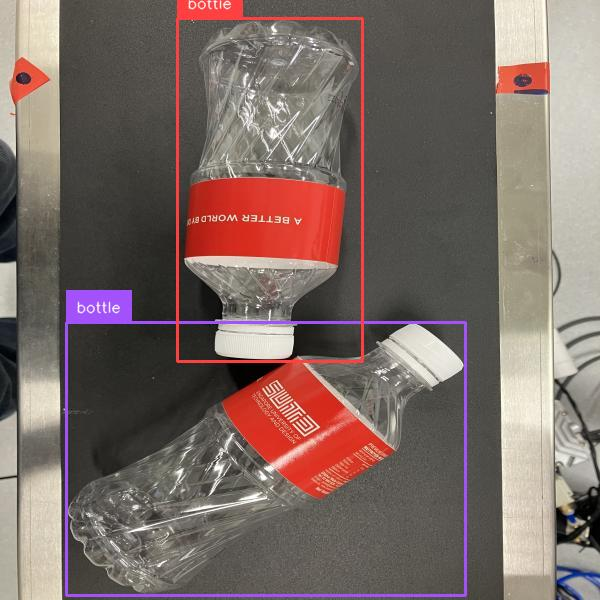
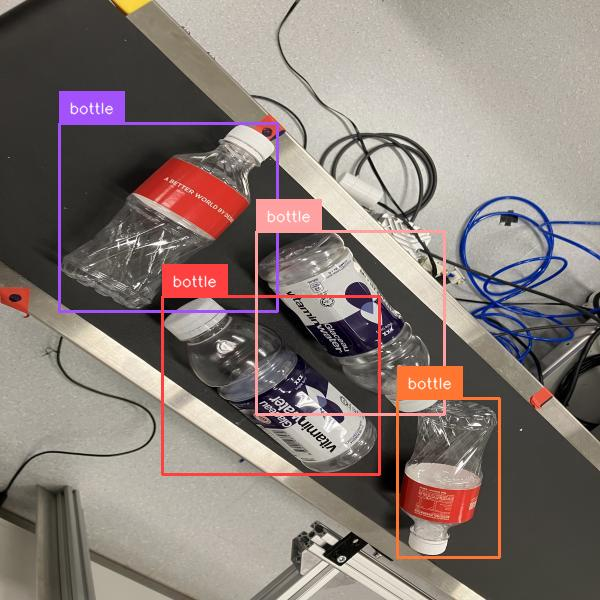
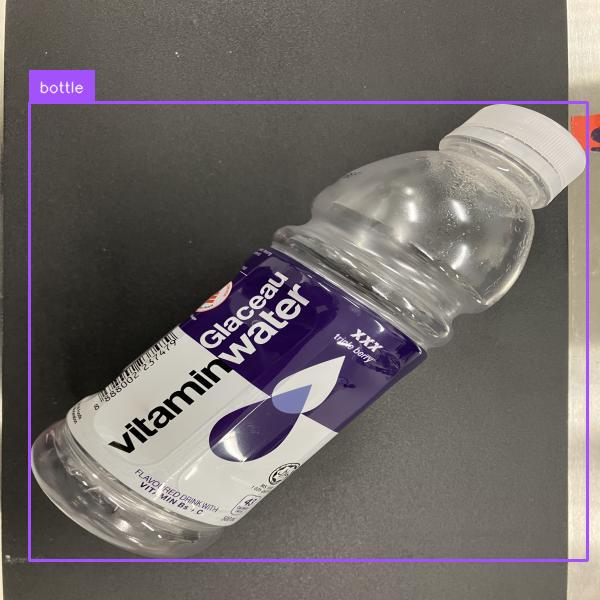
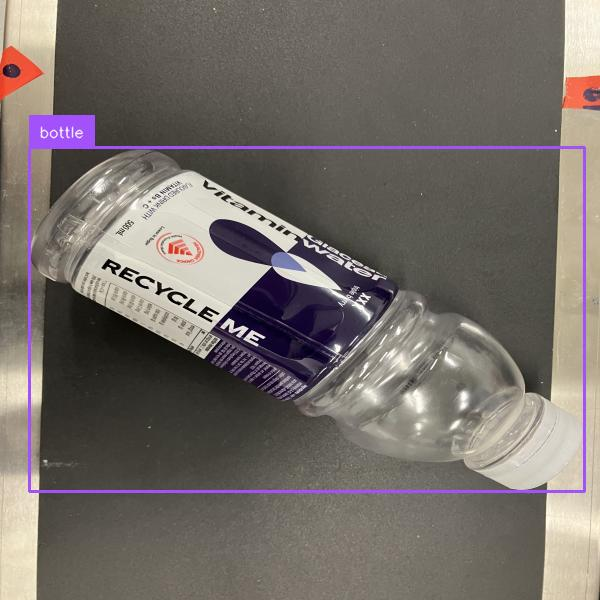
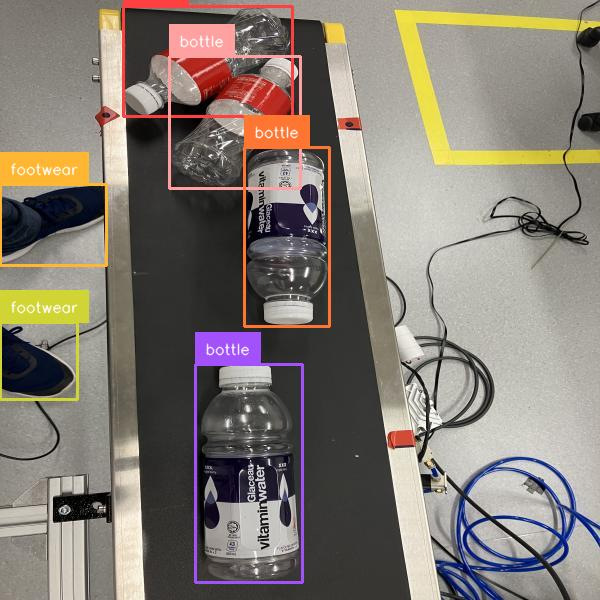

Training Epoch 7/10: 100%|██████████| 23/23 [00:51<00:00,  2.24s/it]


Average Training Loss: 5.51547646522522


Validation Epoch 7/10: 100%|██████████| 2/2 [00:02<00:00,  1.21s/it]


Average Validation Loss: 5.611863374710083



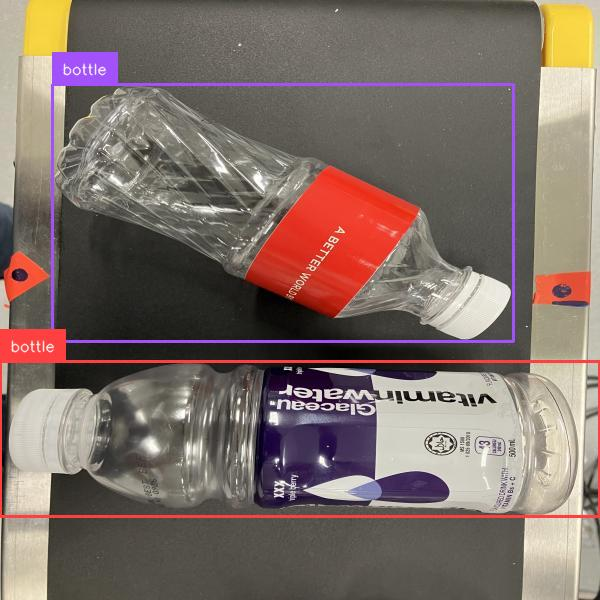
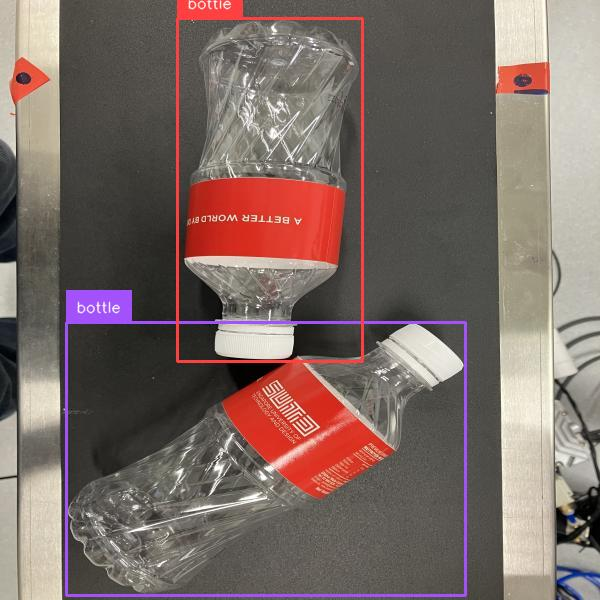
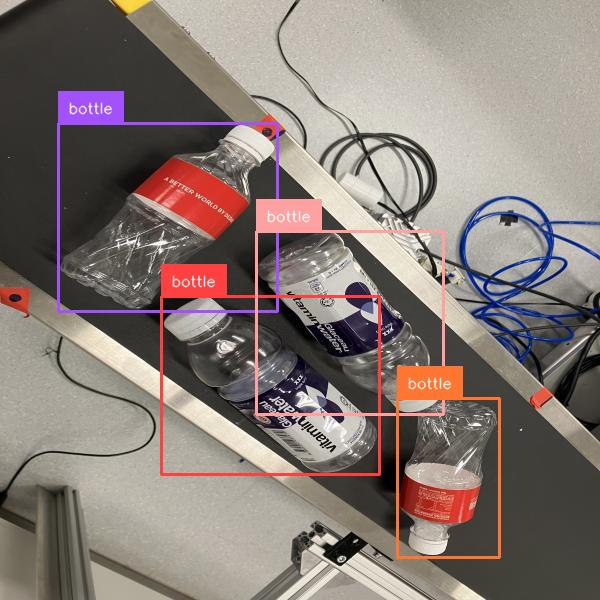
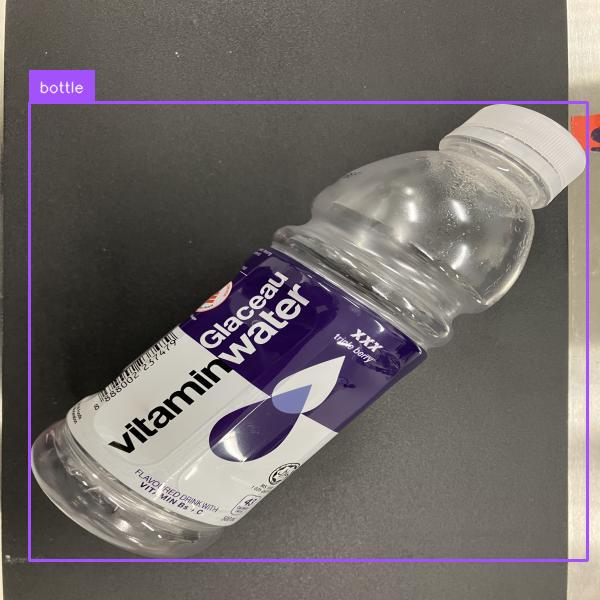
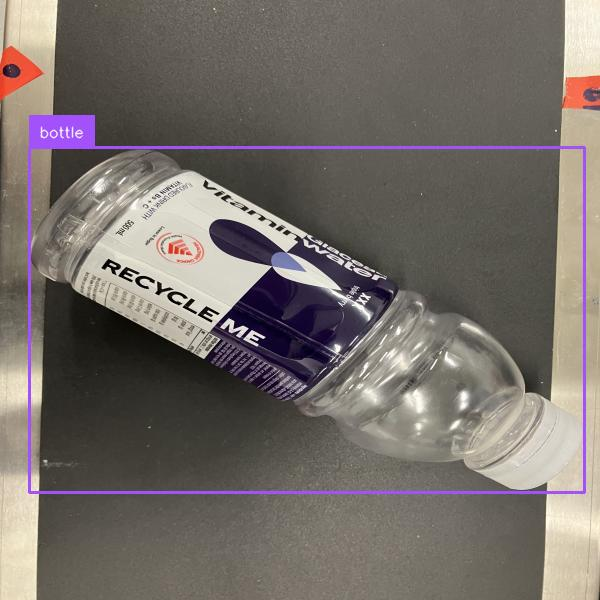
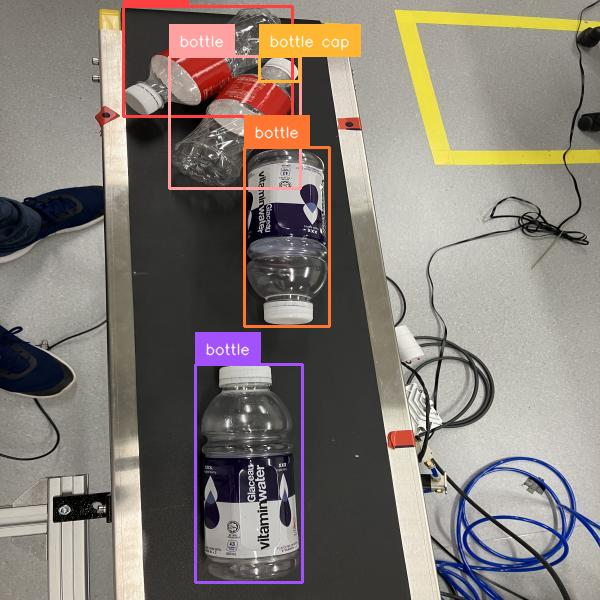

Training Epoch 8/10: 100%|██████████| 23/23 [00:51<00:00,  2.25s/it]


Average Training Loss: 5.480109567227571


Validation Epoch 8/10: 100%|██████████| 2/2 [00:02<00:00,  1.20s/it]


Average Validation Loss: 5.4927287101745605



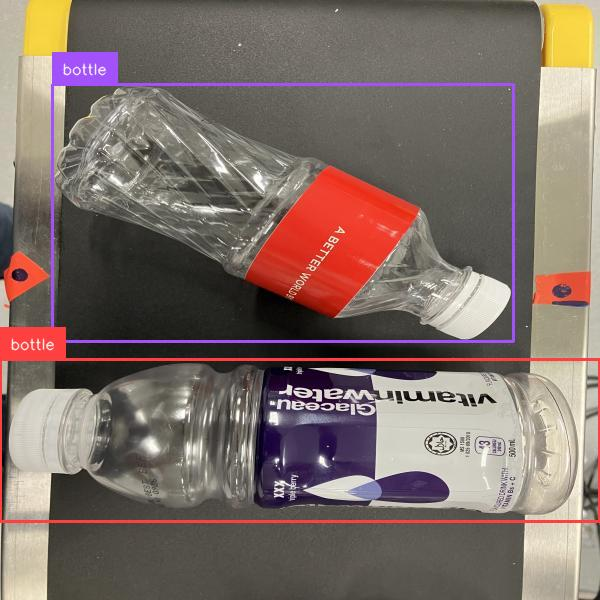
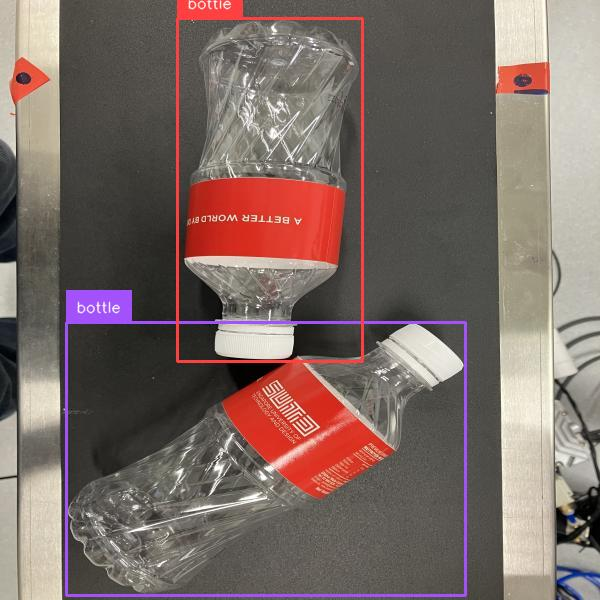
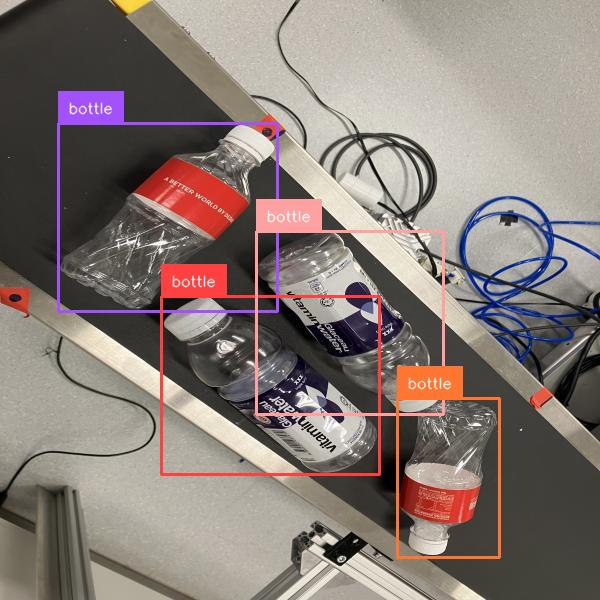
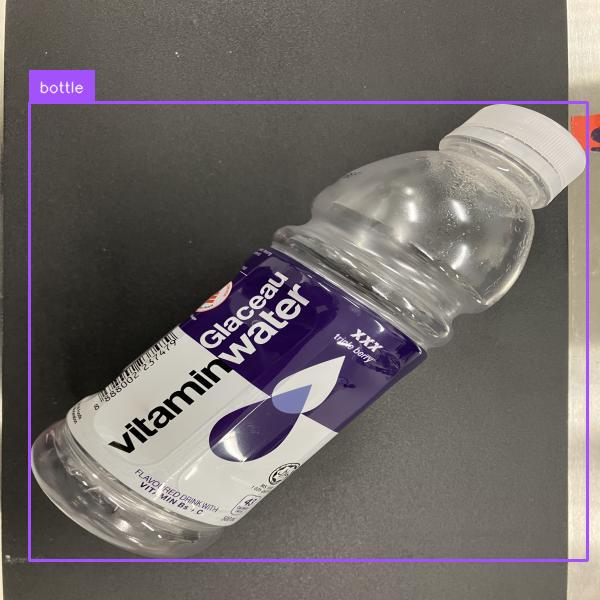
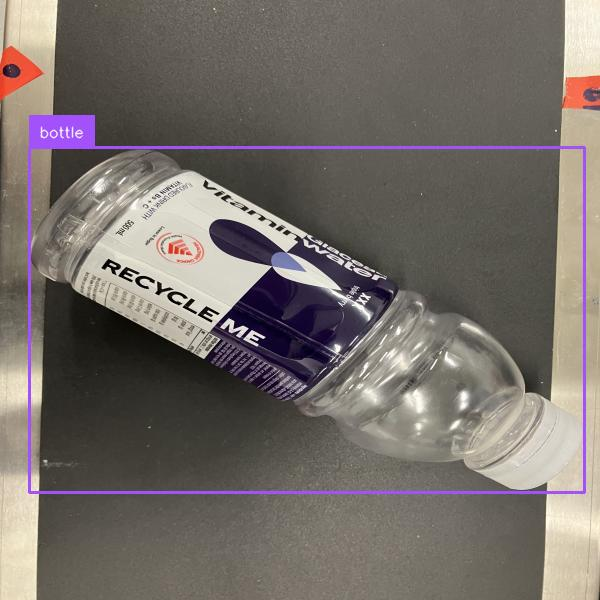
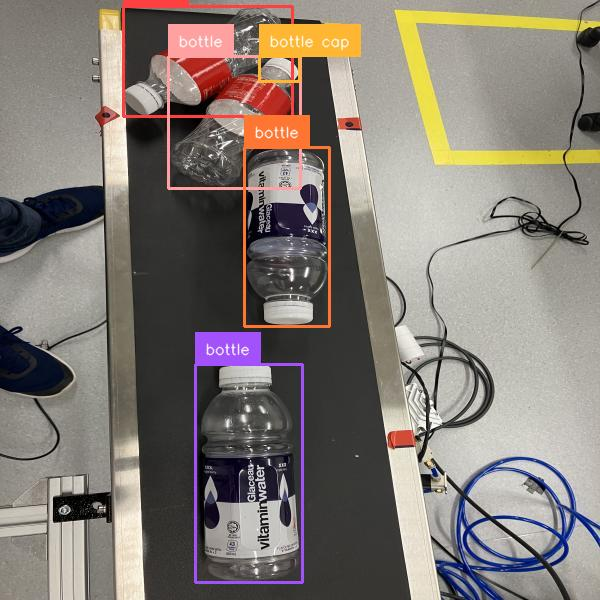

Training Epoch 9/10: 100%|██████████| 23/23 [00:51<00:00,  2.25s/it]


Average Training Loss: 5.516340535619984


Validation Epoch 9/10: 100%|██████████| 2/2 [00:02<00:00,  1.21s/it]


Average Validation Loss: 5.42244553565979



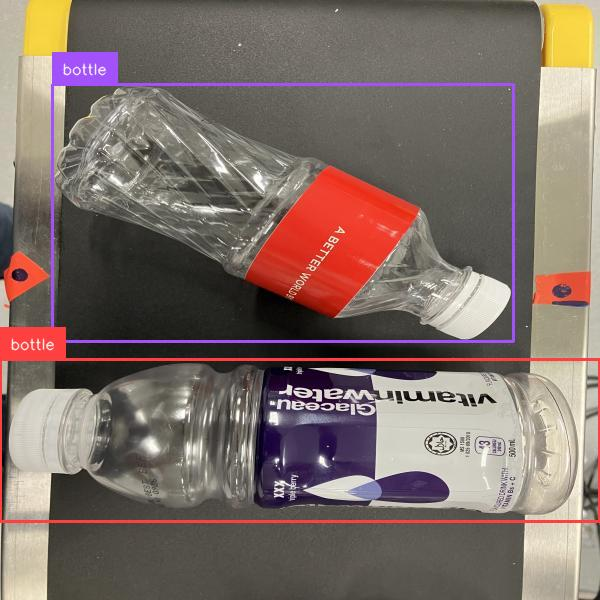
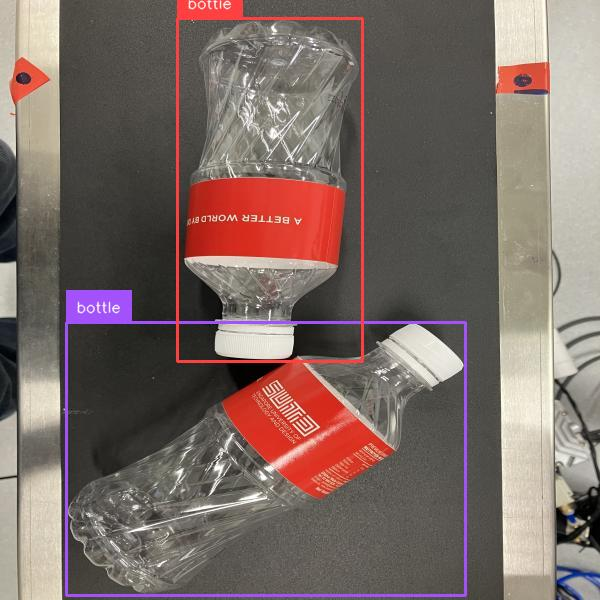
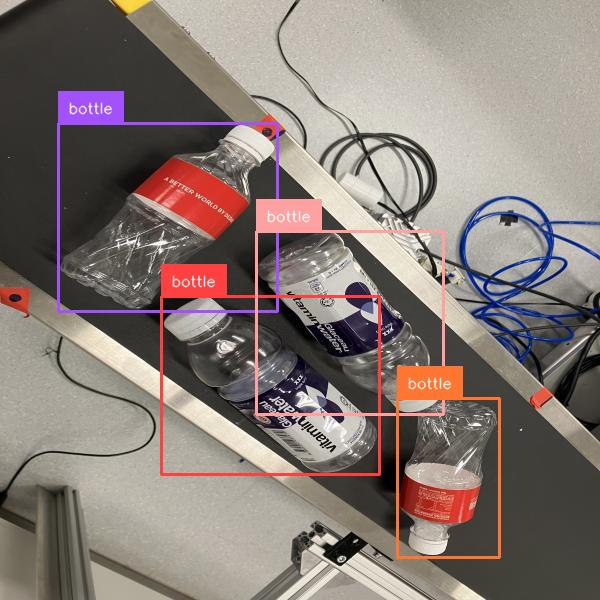
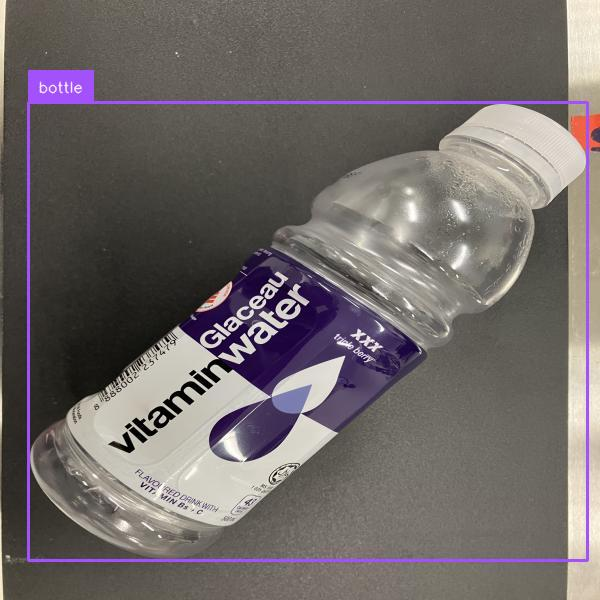
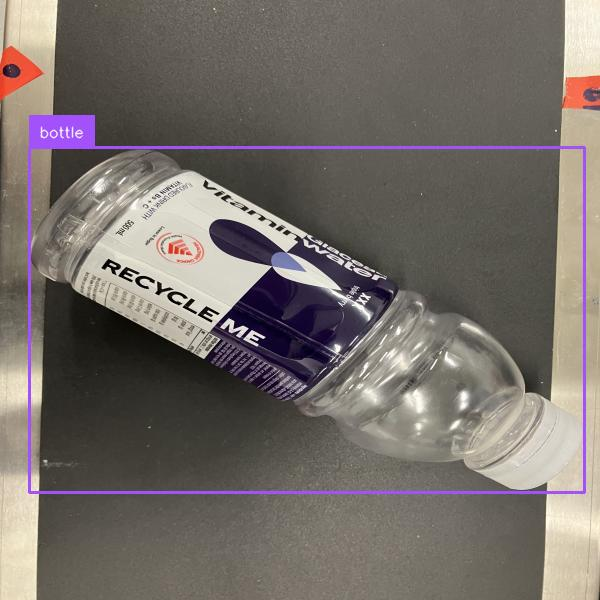
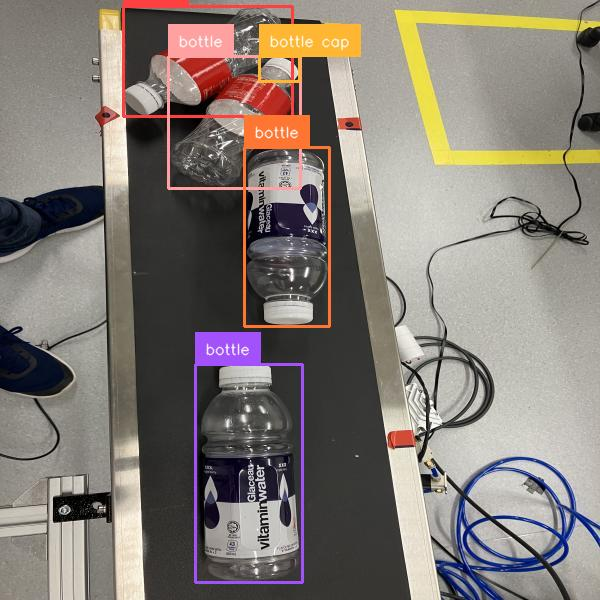

Training Epoch 10/10: 100%|██████████| 23/23 [00:51<00:00,  2.25s/it]


Average Training Loss: 5.542776833409849


Validation Epoch 10/10: 100%|██████████| 2/2 [00:02<00:00,  1.25s/it]


Average Validation Loss: 5.396259307861328



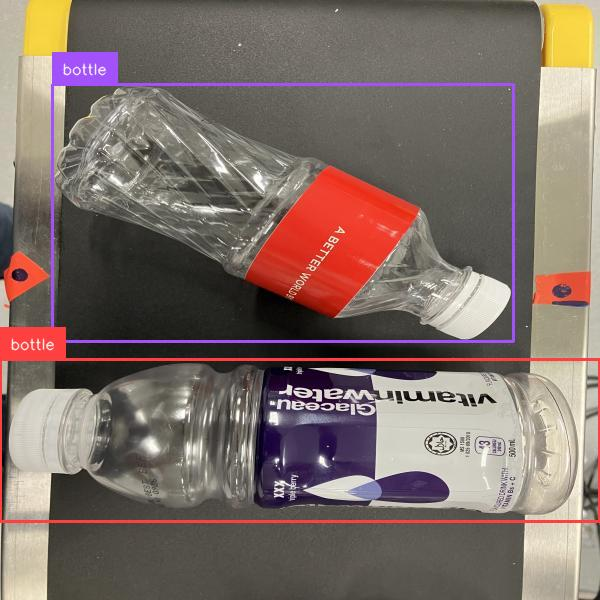
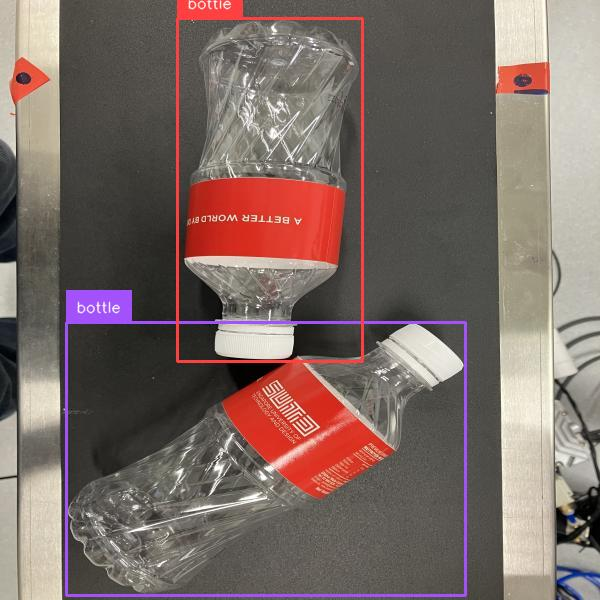
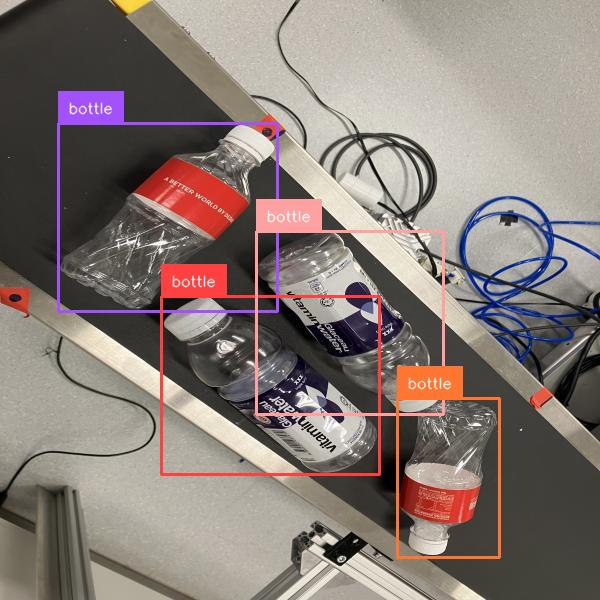
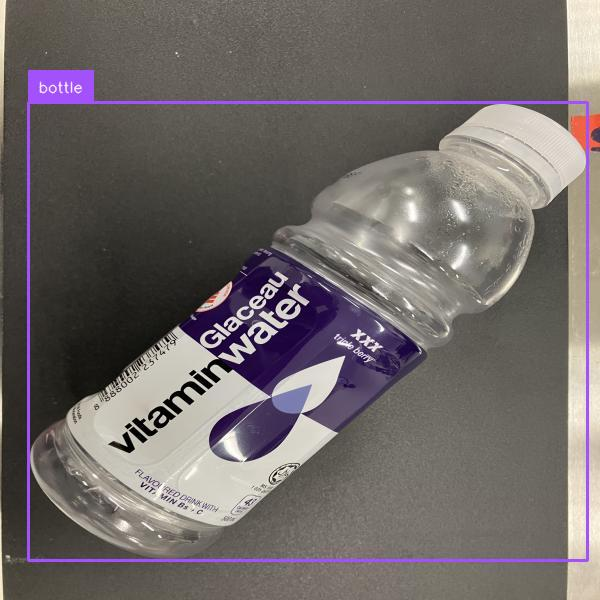
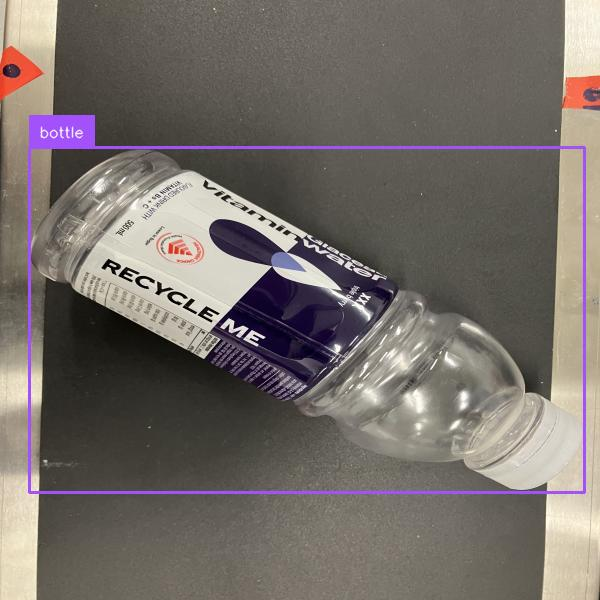
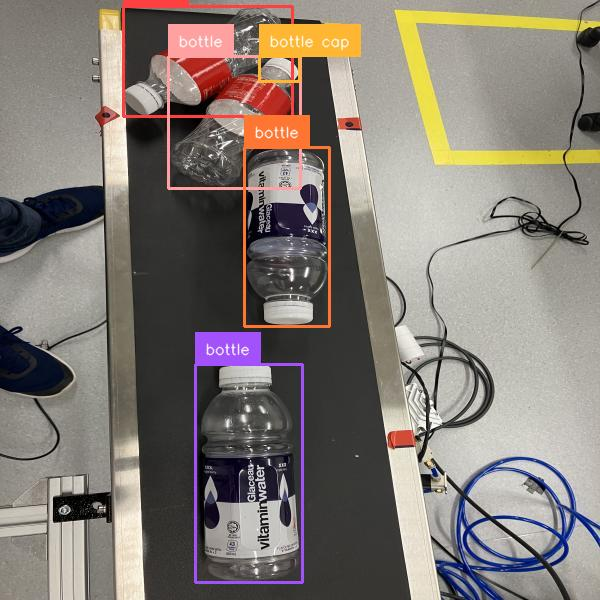

CPU times: user 7min 7s, sys: 2min 18s, total: 9min 25s
Wall time: 9min 40s


In [ ]:
# @title Run train loop

%%time

EPOCHS = 10
LR = 5e-6

train_model(train_loader, val_loader, peft_model, processor, epochs=EPOCHS, lr=LR)

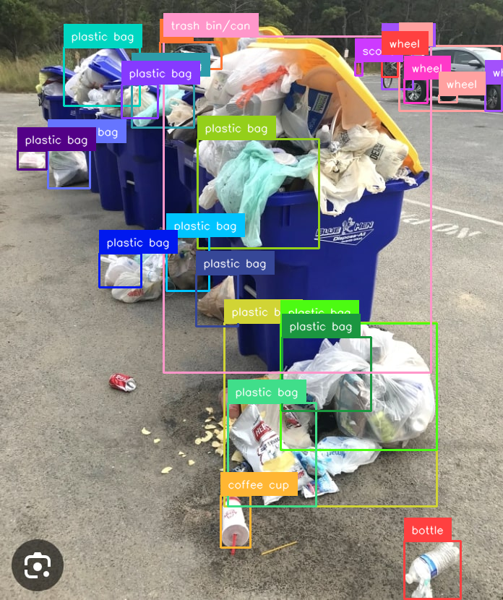

In [ ]:
# @title Check if the model can still detect objects outside of the custom dataset

image = Image.open(EXAMPLE_IMAGE_PATH)
task = "<OD>"
text = "<OD>"

inputs = processor(text=text, images=image, return_tensors="pt").to(DEVICE)
generated_ids = peft_model.generate(
    input_ids=inputs["input_ids"],
    pixel_values=inputs["pixel_values"],
    max_new_tokens=1024,
    num_beams=3
)
generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]
response = processor.post_process_generation(generated_text, task=task, image_size=(image.width, image.height))
detections = sv.Detections.from_lmm(sv.LMM.FLORENCE_2, response, resolution_wh=image.size)

bounding_box_annotator = sv.BoundingBoxAnnotator(color_lookup=sv.ColorLookup.INDEX)
label_annotator = sv.LabelAnnotator(color_lookup=sv.ColorLookup.INDEX)

image = bounding_box_annotator.annotate(image, detections)
image = label_annotator.annotate(image, detections)
image.thumbnail((600, 600))
image

# **Create Auto-Annotation Pipeline**

In [ ]:
def annotate_images(folder_path):
    annotations = {}

    for image_name in os.listdir(folder_path):
        image_path = os.path.join(folder_path, image_name)
        if image_path.endswith(('jpg', 'jpeg', 'png')):
            # Load the image
            image = Image.open(image_path).convert("RGB")
            task = "<OD>"
            text = "<OD>"

            # Prepare inputs
            inputs = processor(text=text, images=image, return_tensors="pt").to(DEVICE)

            # Generate predictions
            generated_ids = model.generate(
                input_ids=inputs["input_ids"],
                pixel_values=inputs["pixel_values"],
                max_new_tokens=1024,
                num_beams=3
            )

            # Decode and post-process the generated text
            generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]
            response = processor.post_process_generation(generated_text, task=task, image_size=(image.width, image.height))
            detections = sv.Detections.from_lmm(sv.LMM.FLORENCE_2, response, resolution_wh=image.size)

            # Annotate the image with bounding boxes and labels
            bounding_box_annotator = sv.BoundingBoxAnnotator(color_lookup=sv.ColorLookup.INDEX)
            label_annotator = sv.LabelAnnotator(color_lookup=sv.ColorLookup.INDEX)

            annotated_image = bounding_box_annotator.annotate(image.copy(), detections)
            annotated_image = label_annotator.annotate(annotated_image, detections)
            annotated_image.thumbnail((600, 600))

            # Save the annotated image
            annotated_image_path = os.path.join(folder_path, "annotated_" + image_name)
            annotated_image.save(annotated_image_path)

            # Store the annotations
            annotations[image_name] = response

    return annotations

In [ ]:
# Specify the folder containing images
image_folder_path = "/content/[folder]"  # Ensure your images are in this folder

# Annotate the images
annotations = annotate_images(image_folder_path)

# Save annotations to a JSON file
output_path = "/content/[folder]/annotations.json"
with open(output_path, "w") as f:
    json.dump(annotations, f)

In [ ]:
def annotate_images(folder_path):
    for image_name in os.listdir(folder_path):
        image_path = os.path.join(folder_path, image_name)
        if image_path.endswith(('jpg', 'jpeg', 'png')):
            # Load the image
            image = Image.open(image_path).convert("RGB")
            task = "<OD>"
            text = "<OD>"

            # Prepare inputs
            inputs = processor(text=text, images=image, return_tensors="pt").to(DEVICE)

            # Generate predictions
            generated_ids = model.generate(
                input_ids=inputs["input_ids"],
                pixel_values=inputs["pixel_values"],
                max_new_tokens=1024,
                num_beams=3
            )

            # Decode and post-process the generated text
            generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]
            response = processor.post_process_generation(generated_text, task=task, image_size=(image.width, image.height))
            detections = sv.Detections.from_lmm(sv.LMM.FLORENCE_2, response, resolution_wh=image.size)

            # Annotate the image with bounding boxes and labels
            bounding_box_annotator = sv.BoundingBoxAnnotator(color_lookup=sv.ColorLookup.INDEX)
            label_annotator = sv.LabelAnnotator(color_lookup=sv.ColorLookup.INDEX)

            annotated_image = bounding_box_annotator.annotate(image.copy(), detections)
            annotated_image = label_annotator.annotate(annotated_image, detections)
            annotated_image.thumbnail((600, 600))

            # Display the annotated image
            display(annotated_image)

            # Save the annotated image
            #annotated_image_path = os.path.join(folder_path, "annotated_" + image_name)
            #annotated_image.save(annotated_image_path)

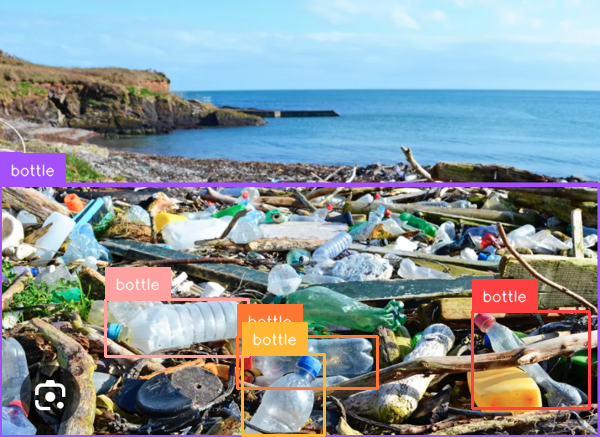

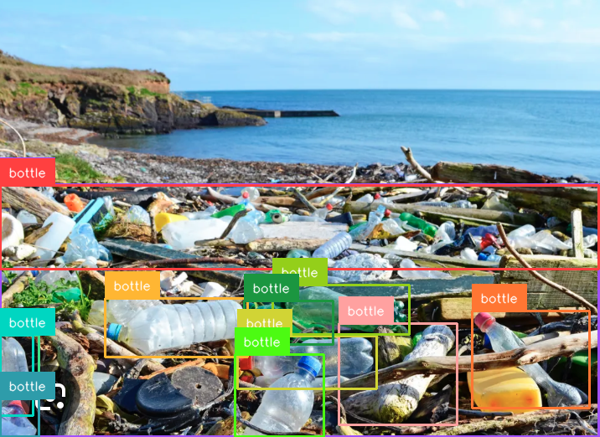

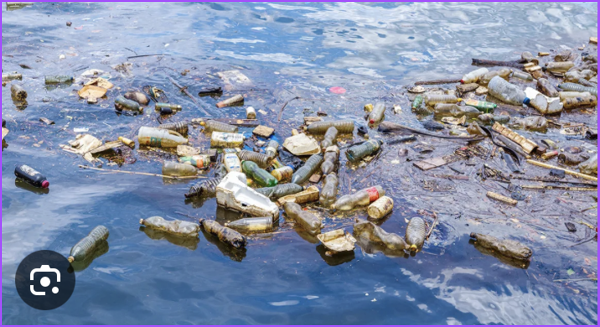

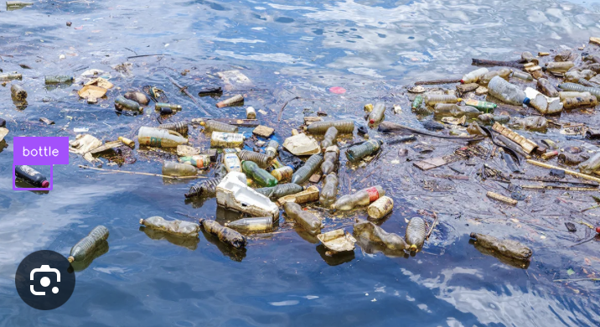

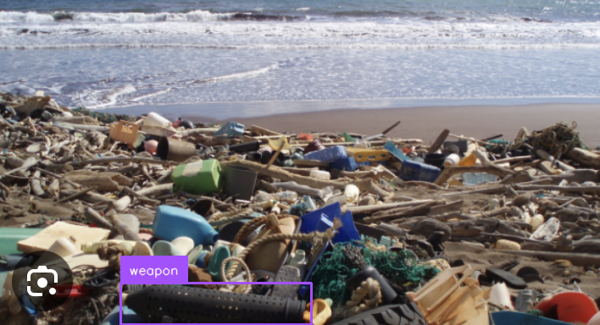

...

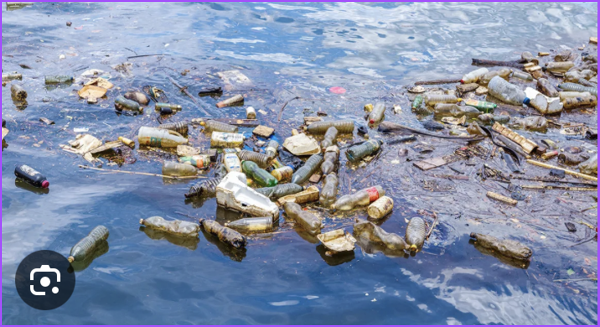

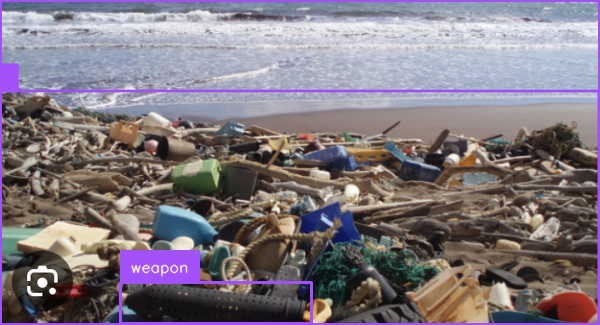

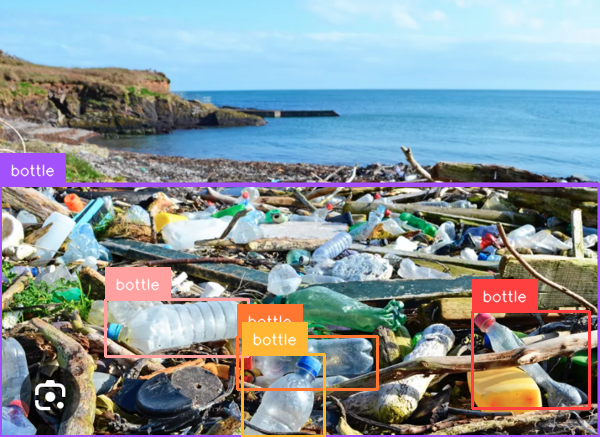

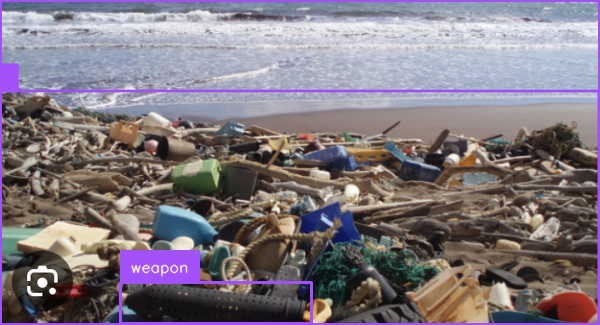

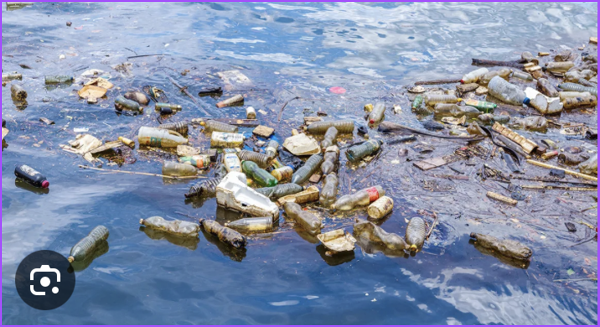

In [ ]:
# Specify the folder containing images
image_folder_path = "/content/[folder]"  # Ensure your images are in this folder

# Annotate the images
annotate_images(image_folder_path)

In [ ]:
import pandas as pd

In [ ]:
df = pd.read_json('/content/[folder]/annotations.json')
df

,Screenshot 2024-07-04 at 14.12.15.png,Screenshot 2024-07-04 at 14.11.58.png,Screenshot 2024-07-04 at 14.12.08.png
<OD>,"{'bboxes': [[0.358000010251998, 220.5450134277...","{'bboxes': [[16.110000610351562, 195.584991455...","{'bboxes': [[142.66200256347656, 334.272003173..."


# **Generate Video Annotations**

In [ ]:
def extract_frames(video_path, output_folder):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    cap = cv2.VideoCapture(video_path)
    frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    frame_rate = int(cap.get(cv2.CAP_PROP_FPS))

    for i in range(frame_count):
        ret, frame = cap.read()
        if ret:
            frame_path = os.path.join(output_folder, f"frame_{i:13d}.jpg")
            cv2.imwrite(frame_path, frame)
        else:
            break
    cap.release()
    return frame_rate

def annotate_frames(folder_path):
    annotated_frames = []

    for image_name in sorted(os.listdir(folder_path)):
        image_path = os.path.join(folder_path, image_name)
        if image_path.endswith(('jpg', 'jpeg', 'png')):
            # Load the image
            image = Image.open(image_path).convert("RGB")
            task = "<OD>"
            text = "<OD>"

            # Prepare inputs
            inputs = processor(text=text, images=image, return_tensors="pt").to(DEVICE)

            # Generate predictions
            generated_ids = model.generate(
                input_ids=inputs["input_ids"],
                pixel_values=inputs["pixel_values"],
                max_new_tokens=1024,
                num_beams=3
            )

            # Decode and post-process the generated text
            generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]
            response = processor.post_process_generation(generated_text, task=task, image_size=(image.width, image.height))
            detections = sv.Detections.from_lmm(sv.LMM.FLORENCE_2, response, resolution_wh=image.size)

            # Annotate the image with bounding boxes and labels
            bounding_box_annotator = sv.BoundingBoxAnnotator(color_lookup=sv.ColorLookup.INDEX)
            label_annotator = sv.LabelAnnotator(color_lookup=sv.ColorLookup.INDEX)

            annotated_image = bounding_box_annotator.annotate(image.copy(), detections)
            annotated_image = label_annotator.annotate(annotated_image, detections)

            # Convert PIL image to numpy array and store it
            annotated_image_np = cv2.cvtColor(np.array(annotated_image), cv2.COLOR_RGB2BGR)
            annotated_frames.append(annotated_image_np)

    return annotated_frames


def compile_video(frames, frame_rate, output_path):
    clip = ImageSequenceClip(frames, fps=frame_rate)
    clip.write_videofile(output_path, codec='libx264')

In [ ]:
# Path to the input video
input_video_path = "/content/Untitled.mov"

# Folder to store the extracted frames
frames_folder = "/content/frame-untitleds"

# Path to the output annotated video
output_video_path = "/content/annotated_video.mp4"

# Extract frames from the video
frame_rate = extract_frames(input_video_path, frames_folder)

# Annotate the frames
annotated_frames = annotate_frames(frames_folder)

# Compile annotated frames back into a video
compile_video(annotated_frames, frame_rate, output_video_path)

# Download the output video
from google.colab import files
files.download(output_video_path)

In [ ]:
compile_video(annotated_frames, frame_rate, output_video_path)


Moviepy - Building video /content/annotated_video.mp4.
Moviepy - Writing video /content/annotated_video.mp4



Moviepy - Done !
Moviepy - video ready /content/annotated_video.mp4
